<div style="
    margin-left: 5%;
    width: 80%;
    text-align: center;
    padding: 40px;
    background: linear-gradient(to right, #f0f0f0, #ffffff);
    border-radius: 16px;
    box-shadow: 0 4px 12px rgba(0, 0, 0, 0.1);
    font-family: 'Segoe UI', sans-serif;
">

# 🎓 **Projet de Fin de Semestre**
## _Bases de Données et Interopérabilité_
### 👥 Étudiants : *ETHEVE Clément, DO VALE Lucas*  
### 📅 Date : 23 Mai 2025

</div>

# Importation des librairies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split
%matplotlib inline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
import plotly.express as px
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from scipy.stats import gaussian_kde
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
import plotly.graph_objects as go
import hvplot.pandas
from sklearn.neighbors import KNeighborsClassifier


# Chargement des données et prétraitement

In [2]:
data_clubs=pd.read_csv("clubs_fr.csv")
data_clubs=data_clubs.drop("name",axis=1) #inutile à la prédiction
data_clubs=data_clubs.drop("foreigners_number",axis=1) #Information déjà contenue dans "foreigners_percentage"


data_events=pd.read_csv("game_events.csv")
data_events=data_events.drop("minute",axis=1)# On simplifie au maximum les dates.

data_playerapp=pd.read_csv("player_appearance.csv")
data_lineup=pd.read_csv("game_lineups.csv")
data_value=pd.read_csv("player_valuation_before_season.csv")

data_matchs=pd.read_csv("matchs_2013_2022.csv")
data_matchs2=pd.read_csv("match_2023.csv")


C:\Users\cleme\AppData\Local\Temp\ipykernel_28432\3241899429.py:10: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  data_lineup=pd.read_csv("game_lineups.csv")


## Data_clubs

In [3]:
data_clubs.head()

,club_id,club_code,domestic_competition_id,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record,coach_name
0,969,montpellier-hsc,FR1,25,25.7,48.0,8,Stade de la Mosson,32939,+€28.60m,NaN
1,1082,losc-lille,FR1,25,25.4,72.0,7,Decathlon Arena-Stade Pierre-Mauroy,50186,+€3.65m,NaN
2,1160,nimes-olympique,FR1,26,25.4,46.2,3,Stade des Antonins,8033,+€2.50m,NaN
3,3911,stade-brest-29,FR1,24,26.0,25.0,3,Stade Francis-Le Blé,15220,+€5.10m,NaN
4,595,sc-bastia,FR1,25,27.6,32.0,6,Stade Armand-Cesari,16480,+€480k,NaN


In [4]:
data_clubs["coach_name"].unique()

array([nan])

In [5]:
data_clubs=data_clubs.drop("coach_name",axis=1)

In [6]:
data_clubs["domestic_competition_id"].unique()
data_clubs=data_clubs.drop("domestic_competition_id",axis=1)

In [7]:
data_clubs[data_clubs["squad_size"]<11]

,club_id,club_code,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record
18,3558,gfc-ajaccio,5,26.8,20.0,1,Stade Ange-Casanova,4050,+-0


Il semblerait qu'on ait une donnée posant problème (impossible de jouer avec 5 joueurs). Regardons si nous pouvons supprimer ce qui concerne cette équipe 

In [8]:
gfc_ajaccio_id = 3558

gfc_ajaccio_matchs = data_matchs[
    (data_matchs["home_club_id"] == gfc_ajaccio_id) | 
    (data_matchs["away_club_id"] == gfc_ajaccio_id)
]


gfc_ajaccio_matchs.head()

,Unnamed: 0,game_id,season,round,date,home_club_id,away_club_id,home_club_goals,away_club_goals,home_club_position,...,stadium,attendance,referee,home_club_formation,away_club_formation,home_club_name,away_club_name,aggregate,competition_type,results
26,305,2586999,2015,13. Matchday,2015-11-07,1421,3558,1,2,14.0,...,Stade Auguste-Delaune,11393.0,Said Ennjimi,4-2-3-1,4-3-1-2,Stade de Reims,GFC Ajaccio,1:2,domestic_league,-1
70,746,2586768,2015,1. Matchday,2015-08-08,1095,3558,0,0,10.0,...,Stade de l'Aube,10858.0,Jérôme Miguelgorry,4-2-3-1,4-4-2 double 6,ESTAC Troyes,GFC Ajaccio,0:0,domestic_league,0
290,4093,2609774,2015,31. Matchday,2016-03-20,417,3558,3,0,3.0,...,Allianz Riviera,19066.0,Nicolas Rainville,4-3-1-2,5-3-2,Olympique Gymnaste Club Nice Côte d'Azur,GFC Ajaccio,3:0,domestic_league,1
321,4484,2587015,2015,15. Matchday,2015-11-28,3558,1158,1,1,16.0,...,Stade Ange-Casanova,3514.0,Jérôme Miguelgorry,4-3-1-2,4-1-4-1,GFC Ajaccio,Football Club Lorient-Bretagne Sud,1:1,domestic_league,0
322,4496,2600621,2015,17. Matchday,2015-12-05,3558,995,1,1,15.0,...,Stade Ange-Casanova,3614.0,Wilfried Bien,4-3-1-2,4-2-3-1,GFC Ajaccio,Football Club de Nantes,1:1,domestic_league,0


Il semble que tous les matchs de cette équipe sont plutôt vieux (antérieurs à 2016). Vérifions si ils sont dans le fichier à prédire:

In [9]:

gfc_ajaccio_id = 3558


gfc_ajaccio_matchs = data_matchs2[
    (data_matchs2["home_club_id"] == gfc_ajaccio_id) | 
    (data_matchs2["away_club_id"] == gfc_ajaccio_id)
]


print(len(gfc_ajaccio_matchs))

0


La théorie s'avère exacte, nous allons donc supprimer ce club pour améliorer la qualité des données.

In [10]:

gfc_ajaccio_id = 3558

# 1. Identifier tous les matchs impliquant le club (domicile ou extérieur)
match_ids_to_remove_1 = data_matchs[
    (data_matchs["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs["away_club_id"] == gfc_ajaccio_id)
]["game_id"].tolist()

match_ids_to_remove_2 = data_matchs2[
    (data_matchs2["home_club_id"] == gfc_ajaccio_id) |
    (data_matchs2["away_club_id"] == gfc_ajaccio_id)
]["game_id"].tolist()

all_game_ids_to_remove = set(match_ids_to_remove_1 + match_ids_to_remove_2)

# 2. Supprimer dans data_events 
data_events = data_events[
    (data_events["club_id"] != gfc_ajaccio_id) &
    (~data_events["game_id"].isin(all_game_ids_to_remove))
]

# 3. Supprimer dans data_playerapp 
data_playerapp = data_playerapp[
    (data_playerapp["player_club_id"] != gfc_ajaccio_id) &
    (data_playerapp["player_current_club_id"] != gfc_ajaccio_id) &
    (~data_playerapp["game_id"].isin(all_game_ids_to_remove))
]

# 4. Supprimer dans data_lineup 
data_lineup = data_lineup[
    (data_lineup["club_id"] != gfc_ajaccio_id) &
    (~data_lineup["game_id"].isin(all_game_ids_to_remove))
]

# 5. Supprimer dans data_value 
data_value = data_value[data_value["current_club_id"] != gfc_ajaccio_id]

# 6. Supprimer dans data_clubs 
data_clubs = data_clubs[data_clubs["club_id"] != gfc_ajaccio_id]

# 7. Supprimer dans les matchs 
data_matchs = data_matchs[
    (data_matchs["home_club_id"] != gfc_ajaccio_id) &
    (data_matchs["away_club_id"] != gfc_ajaccio_id)
]

data_matchs2 = data_matchs2[
    (data_matchs2["home_club_id"] != gfc_ajaccio_id) &
    (data_matchs2["away_club_id"] != gfc_ajaccio_id)
]

print("Toutes les données du GFC Ajaccio ont été supprimées de tous les jeux de données.")

Toutes les données du GFC Ajaccio ont été supprimées de tous les jeux de données.


In [11]:
data_clubs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34 entries, 0 to 34
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   club_id                34 non-null     int64  
 1   club_code              34 non-null     object 
 2   squad_size             34 non-null     int64  
 3   average_age            34 non-null     float64
 4   foreigners_percentage  34 non-null     float64
 5   national_team_players  34 non-null     int64  
 6   stadium_name           34 non-null     object 
 7   stadium_seats          34 non-null     int64  
 8   net_transfer_record    34 non-null     object 
dtypes: float64(2), int64(4), object(3)
memory usage: 2.7+ KB


In [12]:
data_clubs["net_transfer_record"]

0      +€28.60m
1       +€3.65m
2       +€2.50m
3       +€5.10m
4        +€480k
5      +€30.30m
6      +€62.10m
7      +€10.85m
8       +€1.50m
9      +€12.70m
10          +-0
11          +-0
12     +€22.05m
13      +€2.52m
14     €-22.60m
15      +€6.30m
16     +€31.99m
17      +€3.05m
19     €-16.20m
20          +-0
21     €-30.20m
22    €-247.00m
23      +€3.70m
24     +€12.85m
25          +-0
26      +€3.50m
27      +€8.90m
28      €-2.90m
29       +€700k
30      +€3.64m
31      €-4.05m
32     €-33.69m
33          +-0
34     +€23.70m
Name: net_transfer_record, dtype: object

Nous allons convertir cette colonne en données plus exploitables

In [13]:
# Cherchons si on a différentes monnaies:
data_clubs['net_transfer_record'].str.extract(r'([€$£¥])')[0].unique()

array(['€', nan], dtype=object)

In [14]:
df_nan = data_clubs[data_clubs['net_transfer_record'].isna()]
df_nan

,club_id,club_code,squad_size,average_age,foreigners_percentage,national_team_players,stadium_name,stadium_seats,net_transfer_record


Heureusement, il n'y a aucune valeur nulle et toutes les données sont en euros.

In [15]:
#transformons tout ça en float
df_monnaie = data_clubs['net_transfer_record'].dropna().apply(
    lambda x: x[-1] if isinstance(x, str) else None
).unique()

print("Unités trouvées :", df_monnaie)

Unités trouvées : ['m' 'k' '0']


In [16]:
def conversion_en_millions(value):
    if pd.isna(value):
        return 0  

    value = str(value).replace('€', '').strip()  # Convertir en string et enlever le signe €
    
    
    if value.startswith('+'):
        value = value[1:]  
    elif value.startswith('-'):
        value = value  
    
    # Gérer les valeurs comme "+-0" (ce n'est pas un nombre valide)
    if value == '0':
        return 0

    # Conversion
    if value.endswith('m'):
        return float(value.replace('m', ''))
    elif value.endswith('k'):
        return float(value.replace('k', '')) / 1000
    else:
        return float(value)  # Si pas de suffixe, on retourne la valeur directement

# Appliquer la fonction à chaque élément de la colonne
data_clubs["net_transfer_record_num"] = data_clubs["net_transfer_record"].apply(conversion_en_millions)

# Afficher le résultat
print(data_clubs["net_transfer_record_num"])

0      28.60
1       3.65
2       2.50
3       5.10
4       0.48
5      30.30
6      62.10
7      10.85
8       1.50
9      12.70
10     -0.00
11     -0.00
12     22.05
13      2.52
14    -22.60
15      6.30
16     31.99
17      3.05
19    -16.20
20     -0.00
21    -30.20
22   -247.00
23      3.70
24     12.85
25     -0.00
26      3.50
27      8.90
28     -2.90
29      0.70
30      3.64
31     -4.05
32    -33.69
33     -0.00
34     23.70
Name: net_transfer_record_num, dtype: float64


In [17]:
# Nombre de valeurs nulles par colonne
print(data_clubs.isnull().sum())

# Pourcentage de valeurs nulles
print((data_clubs.isnull().mean() * 100).round(2).sort_values(ascending=False))

club_id                    0
club_code                  0
squad_size                 0
average_age                0
foreigners_percentage      0
national_team_players      0
stadium_name               0
stadium_seats              0
net_transfer_record        0
net_transfer_record_num    0
dtype: int64
club_id                    0.0
club_code                  0.0
squad_size                 0.0
average_age                0.0
foreigners_percentage      0.0
national_team_players      0.0
stadium_name               0.0
stadium_seats              0.0
net_transfer_record        0.0
net_transfer_record_num    0.0
dtype: float64


## Data_events

On commence par supprimer Unnamed 0 qui est un index. 

In [18]:
data_events=data_events.drop(["Unnamed: 0"],axis=1)
data_events.head(3)

,game_event_id,date,game_id,type,club_id,player_id,description,player_in_id,player_assist_id
0,5d2b67957aaae6cf2a41e70cb5d4024f,2012-09-22,2223841,Substitutions,3911,5399,", Not reported",37516.0,NaN
1,cd511880b945623db06ace57349e45b2,2012-09-22,2223841,Goals,3911,24459,", Penalty, 2. Goal of the Season Assist: , Fou...",NaN,24459.0
2,8ca118538b45a24643ab1c9f76e50f6d,2012-09-22,2223841,Substitutions,3911,25113,", Not reported",22053.0,NaN


In [19]:
# Nombre de valeurs nulles par colonne
print(data_events.isnull().sum())

# Pourcentage de valeurs nulles
print((data_events.isnull().mean() * 100).round(2).sort_values(ascending=False))

game_event_id           0
date                    0
game_id                 0
type                    0
club_id                 0
player_id               0
description         21109
player_in_id        14808
player_assist_id    38413
dtype: int64
player_assist_id    94.42
description         51.89
player_in_id        36.40
game_event_id        0.00
date                 0.00
game_id              0.00
type                 0.00
club_id              0.00
player_id            0.00
dtype: float64


In [20]:
data_events["player_in_id"] = data_events["player_in_id"].fillna(0)
data_events["player_assist_id"]=data_events["player_assist_id"].fillna(0)

Rien d'autre ici n'est préocuppant. On a le club_id et le player_id pour chaque ligne, c'est l'essentiel qui nous serivira éventuellement à faire des variables de scoring.

In [21]:
data_events["player_in_id"]=data_events.player_in_id.astype('int')
data_events["player_assist_id"]=data_events.player_assist_id.astype('int')
data_events['date'] = pd.to_datetime(data_events['date'])
data_events.info()


<class 'pandas.core.frame.DataFrame'>
Index: 40681 entries, 0 to 40994
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   game_event_id     40681 non-null  object        
 1   date              40681 non-null  datetime64[ns]
 2   game_id           40681 non-null  int64         
 3   type              40681 non-null  object        
 4   club_id           40681 non-null  int64         
 5   player_id         40681 non-null  int64         
 6   description       19572 non-null  object        
 7   player_in_id      40681 non-null  int32         
 8   player_assist_id  40681 non-null  int32         
dtypes: datetime64[ns](1), int32(2), int64(3), object(3)
memory usage: 2.8+ MB


# Player_app

In [22]:
data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
# Nombre de valeurs nulles par colonne
print(data_playerapp.isnull().sum())

# Pourcentage de valeurs nulles
print((data_playerapp.isnull().mean() * 100).round(2).sort_values(ascending=False))

appearance_id             0
game_id                   0
player_id                 0
player_club_id            0
player_current_club_id    0
date                      0
player_name               0
competition_id            0
yellow_cards              0
red_cards                 0
goals                     0
assists                   0
minutes_played            0
dtype: int64
appearance_id             0.0
game_id                   0.0
player_id                 0.0
player_club_id            0.0
player_current_club_id    0.0
date                      0.0
player_name               0.0
competition_id            0.0
yellow_cards              0.0
red_cards                 0.0
goals                     0.0
assists                   0.0
minutes_played            0.0
dtype: float64


# Data_lineup

In [23]:
data_lineup=data_lineup.drop(["Unnamed: 0"],axis=1)
data_lineup['date'] = pd.to_datetime(data_lineup['date'])
data_lineup["team_captain"]=data_lineup.team_captain.astype(bool)
#Il existe une valeur "number" problématique "-" qu'on remplacera par 0
data_lineup["number"] = pd.to_numeric(data_lineup["number"], errors='coerce').fillna(0).astype(int)

# Data_matchs

In [24]:
data_matchs=data_matchs.drop(["Unnamed: 0"],axis=1)
data_matchs["home_club_position"]=data_matchs.home_club_position.astype(int)
data_matchs["away_club_position"]=data_matchs.away_club_position.astype(int)
data_matchs["attendance"] = data_matchs["attendance"].fillna(0).astype(int)
data_matchs["date"]=pd.to_datetime(data_matchs["date"])

data_matchs.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4040 entries, 0 to 4077
Data columns (total 22 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   game_id                 4040 non-null   int64         
 1   season                  4040 non-null   int64         
 2   round                   4040 non-null   object        
 3   date                    4040 non-null   datetime64[ns]
 4   home_club_id            4040 non-null   int64         
 5   away_club_id            4040 non-null   int64         
 6   home_club_goals         4040 non-null   int64         
 7   away_club_goals         4040 non-null   int64         
 8   home_club_position      4040 non-null   int32         
 9   away_club_position      4040 non-null   int32         
 10  home_club_manager_name  4040 non-null   object        
 11  away_club_manager_name  4040 non-null   object        
 12  stadium                 4040 non-null   object       

In [25]:
data_matchs.isnull().sum()

game_id                     0
season                      0
round                       0
date                        0
home_club_id                0
away_club_id                0
home_club_goals             0
away_club_goals             0
home_club_position          0
away_club_position          0
home_club_manager_name      0
away_club_manager_name      0
stadium                     0
attendance                  0
referee                     0
home_club_formation       382
away_club_formation       382
home_club_name              0
away_club_name              0
aggregate                   0
competition_type            0
results                     0
dtype: int64

# Premières visualisations générales

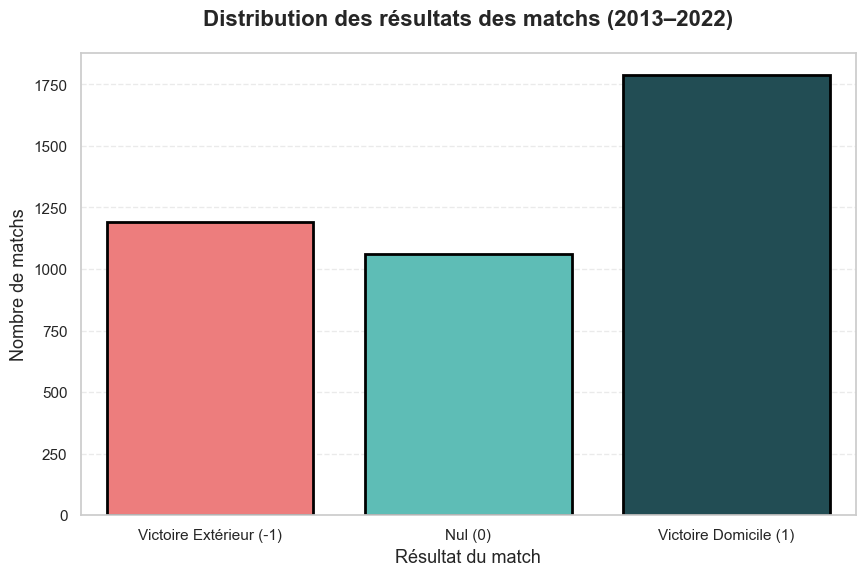

In [26]:
sns.set(style="whitegrid")  
plt.figure(figsize=(10, 6))


custom_palette = ["#FF6B6B", "#4ECDC4", "#1A535C"]  


ax = sns.countplot(
    x='results',
    data=data_matchs,
    palette=custom_palette,
    linewidth=2,
    edgecolor='black'
)


plt.title('Distribution des résultats des matchs (2013–2022)', fontsize=16, weight='bold', pad=20)
plt.xlabel('Résultat du match', fontsize=13)
plt.ylabel('Nombre de matchs', fontsize=13)
plt.xticks(ticks=[0, 1, 2], labels=["Victoire Extérieur (-1)", "Nul (0)", "Victoire Domicile (1)"], fontsize=11)


plt.grid(axis='y', linestyle='--', alpha=0.4)


In [27]:
resultats_saison = data_matchs.groupby(['season', 'results']).size().reset_index(name='count')
pivot = resultats_saison.pivot(index='season', columns='results', values='count').fillna(0)
pivot.columns = ['Extérieur (-1)', 'Nul (0)', 'Domicile (1)']
pivot['Total'] = pivot.sum(axis=1)

for col in ['Domicile (1)', 'Nul (0)', 'Extérieur (-1)']:
    pivot[col + ' %'] = pivot[col] / pivot['Total'] * 100

df_plot = pivot[[col + ' %' for col in ['Domicile (1)', 'Nul (0)', 'Extérieur (-1)']]].reset_index()
df_plot = df_plot.melt(id_vars='season', var_name='Résultat', value_name='Pourcentage')

fig = px.line(
    df_plot,
    x='season',
    y='Pourcentage',
    color='Résultat',
    markers=True,
    line_dash='Résultat',
    title='Évolution des résultats des matchs par saison (2013–2022)',
    template='plotly_white',
    color_discrete_map={
        'Domicile (1) %': '#1f77b4',
        'Nul (0) %': '#ff7f0e',
        'Extérieur (-1) %': '#2ca02c'
    }
)

fig.update_layout(
    title_font_size=20,
    xaxis_title='Saison',
    yaxis_title='Pourcentage (%)',
    legend_title='Résultat',
    hovermode='x unified'
)

fig.show()

Il serait donc logique de conclure que le paramètre domicile/extérieur est quasi invariant dans la détermination du résultat. On trouverait donc ici une variable intéressante pour de la prédiction:

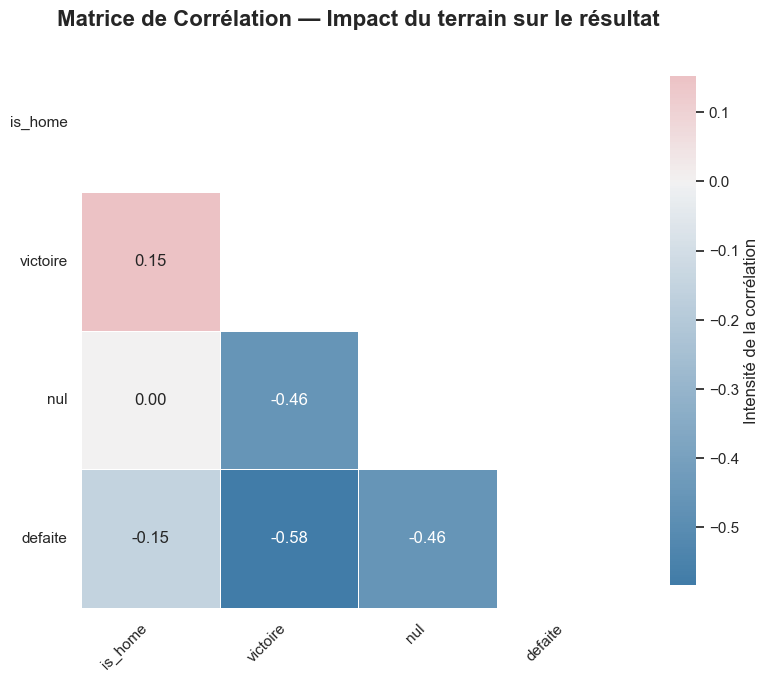

In [28]:
df_home = data_matchs[['game_id', 'home_club_name', 'results']].copy()
df_home = df_home.rename(columns={'home_club_name': 'club'})
df_home['is_home'] = 1
df_home['result_team'] = df_home['results']  

df_away = data_matchs[['game_id', 'away_club_name', 'results']].copy()
df_away = df_away.rename(columns={'away_club_name': 'club'})
df_away['is_home'] = 0
df_away['result_team'] = df_away['results'] * -1  

# Fusion des deux DataFrames
df_long = pd.concat([df_home, df_away], ignore_index=True)

# Colonnes binaires pour chaque issue
df_long['victoire'] = (df_long['result_team'] == 1).astype(int)
df_long['nul'] = (df_long['result_team'] == 0).astype(int)
df_long['defaite'] = (df_long['result_team'] == -1).astype(int)

# Matrice de corrélation
corr_matrix = df_long[['is_home', 'victoire', 'nul', 'defaite']].corr()





plt.figure(figsize=(8, 7))
sns.set(style="white")

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

custom_cmap = sns.diverging_palette(240, 10, as_cmap=True)

ax = sns.heatmap(
    corr_matrix,
    mask=mask,
    cmap=custom_cmap,
    annot=True,
    fmt=".2f",
    center=0,
    square=True,
    linewidths=0.6,
    cbar_kws={
        "shrink": 0.85,
        "orientation": "vertical",
        "label": "Intensité de la corrélation"
    }
)

plt.title("Matrice de Corrélation — Impact du terrain sur le résultat", fontsize=16, weight='bold', pad=20)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.yticks(rotation=0, fontsize=11)
sns.despine(left=True, bottom=True)
plt.tight_layout()
plt.show()

Ainsi, il convient de noter qu'il serait intéressant de mettre plus en lumière cette information pour le modèle.

In [29]:
# 1. Ajouter une colonne du total de buts
total_goals = data_matchs["home_club_goals"] + data_matchs["away_club_goals"]
x = total_goals.dropna()
x_range = np.linspace(x.min(), x.max(), 500)
kde = gaussian_kde(x, bw_method=1.5)
kde_y = kde(x_range)

hist_vals, bins = np.histogram(x, bins=range(0, int(x.max())+2), density=True)
bin_centers = 0.5 * (bins[1:] + bins[:-1])

fig = go.Figure()

fig.add_trace(go.Bar(
    x=bin_centers,
    y=hist_vals,
    marker=dict(color='rgba(105, 179, 162, 0.5)', line=dict(color='black', width=1)),
    name='Histogramme (densité)'
))

fig.add_trace(go.Scatter(
    x=x_range,
    y=kde_y,
    mode='lines',
    name='KDE lissée',
    line=dict(color='orangered', width=3)
))

fig.update_layout(
    title='Distribution interactive des buts par match (2013–2022)',
    xaxis_title='Nombre total de buts',
    yaxis_title='Densité',
    template='plotly_white',
    legend=dict(x=0.7, y=0.95, bgcolor='rgba(255,255,255,0.8)'),
    hovermode='x unified'
)

fig.show()

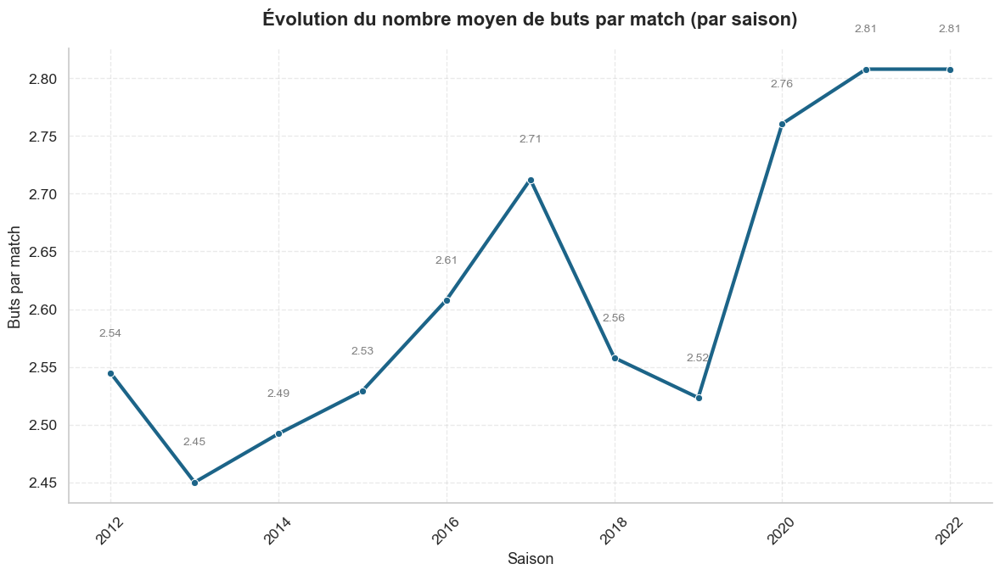

In [30]:

moyenne_buts_par_saison = data_matchs.groupby("season").apply(
    lambda df: (df["home_club_goals"] + df["away_club_goals"]).mean()
).reset_index(name="total_goals")

sns.set(style="whitegrid", font_scale=1.15)

plt.figure(figsize=(12, 7))
palette = sns.color_palette("crest", as_cmap=False)

sns.lineplot(
    data=moyenne_buts_par_saison,
    x="season",
    y="total_goals",
    marker="o",
    linewidth=3,
    color=palette[4]
)

for i, row in moyenne_buts_par_saison.iterrows():
    plt.text(row["season"], row["total_goals"] + 0.03, f"{row['total_goals']:.2f}",
             ha='center', va='bottom', fontsize=10, color='gray')

plt.title("Évolution du nombre moyen de buts par match (par saison)", fontsize=16, weight='bold', pad=20)
plt.xlabel("Saison", fontsize=13)
plt.ylabel("Buts par match", fontsize=13)
plt.grid(True, linestyle="--", alpha=0.4)
plt.xticks(rotation=45)
sns.despine()
plt.tight_layout()
plt.show()

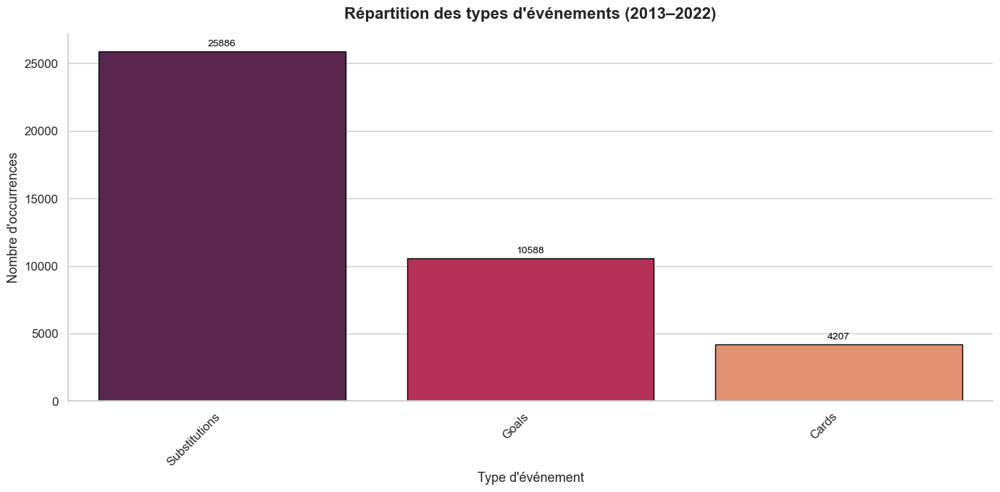

In [31]:
event_counts = data_events["type"].value_counts().reset_index()
event_counts.columns = ["Type d'événement", "Nombre"]

plt.figure(figsize=(14, 7))
sns.set(style="whitegrid", font_scale=1.1)

palette = sns.color_palette("rocket", n_colors=len(event_counts))

ax = sns.barplot(
    data=event_counts,
    x="Type d'événement",
    y="Nombre",
    palette=palette,
    edgecolor="black"
)

for container in ax.containers:
    ax.bar_label(container, fmt="%d", label_type="edge", padding=3, fontsize=10, color="black")

plt.title("Répartition des types d'événements (2013–2022)", fontsize=16, weight='bold', pad=15)
plt.xlabel("Type d'événement", fontsize=13)
plt.ylabel("Nombre d'occurrences", fontsize=13)
plt.xticks(rotation=45, ha='right')
sns.despine()
plt.tight_layout()
plt.show()

In [32]:
toutes_saisons = sorted(data_matchs["season"].unique())
cards = data_events[data_events["type"] == "Cards"].copy()
cards["season"] = cards["game_id"].map(data_matchs.set_index("game_id")["season"])
cards_par_saison = cards.groupby("season").size().reindex(toutes_saisons, fill_value=0).reset_index()
cards_par_saison.columns = ["season", "nb_cartons"]


cards_par_saison.hvplot.bar(
    x='season',
    y='nb_cartons',
    title='Nombre total de cartons par saison',
    xlabel='Saison',
    ylabel='Nombre de cartons',
    color='orange',
    width=800,
    height=400,
    tools=['hover'],
    line_color='black'
)

:Bars   [season]   (nb_cartons)

In [33]:

data_events["season"] = data_events["game_id"].map(data_matchs.set_index("game_id")["season"])


events_2014 = data_events[data_events["season"] == 2014]


print("Types d'événements en 2014 :", events_2014["type"].unique())

descriptions_cartons = events_2014["description"].dropna().str.lower()
carton_mentions = descriptions_cartons[descriptions_cartons.str.contains("card")]


print(f"Nombre d'événements avec 'card' en description en 2014 : {len(carton_mentions)}")


Types d'événements en 2014 : ['Goals' 'Substitutions']
Nombre d'événements avec 'card' en description en 2014 : 0


Il semble très clairement qu'il y ait des données lacunaires ici. (Il est très peu probable qu'il n'y ai eu ancun carton pendant 4 ans). Il faudra prendre cela en compte si l'on cherche à faire des variables de scoring y étant liées.

# Premier enrichissement des variables (modèle simple)

In [34]:
data_matchs_m1=data_matchs.copy()

#### 1) Domicile/Extérieur: l'info étant déjà visiblement contenue dans le dataframe, nous n'y toucherons pas pour le moment

#### 2) Puissance économique du club

In [35]:
# Filtrer sur l'année 2022 uniquement
# Convertir la colonne 'date' en datetime
data_value['date'] = pd.to_datetime(data_value['date'])
data_value_2022 = data_value[data_value['date'].dt.year == 2022]


data_value_2022_sorted = data_value_2022.sort_values(['player_id', 'date'])


latest_values_2022 = data_value_2022_sorted.groupby('player_id').tail(1)


club_values_2022 = latest_values_2022.groupby('current_club_id')['market_value_in_eur'].sum().reset_index()


club_values_2022 = club_values_2022.rename(columns={'market_value_in_eur': 'total_market_value_eur'})

club_values_2022.head()

,current_club_id,total_market_value_eur
0,40,31450000
1,162,327660000
2,244,277650000
3,273,298625000
4,290,30500000


Nous ne prendrons que les données de 2022. En effet, il se pourrait qu'il y ait des joueurs à la retraite, qui fausseraient donc nos données.
Dans le cas où un joueur ne serait pas récemment répertorié, ça ne sera pas tellement problématique car l'on pourrait en déduire qu'il est de moindre importance et donc que sa valeur est faible.

Pour le moment, nous ne mettrons pas nos données à l'échelle (par nombre de joueurs). En effet, nous cherchons ici une information générale sur la puissance économique totale d'un club. En faisant une moyenne, on perdrait l'information sur la capacité de roulement d'une équipe.

In [36]:
# On renomme la colonne club_id dans club_values pour faciliter les merges
club_values = club_values_2022.rename(columns={'current_club_id': 'club_id'})

# Merge pour le club domicile
data_matchs_m1 = data_matchs_m1.merge(
    club_values[['club_id', 'total_market_value_eur']], 
    left_on='home_club_id', right_on='club_id', how='left'
).rename(columns={'total_market_value_eur': 'home_club_market_value'})


data_matchs_m1 = data_matchs_m1.drop(columns=['club_id'])

# Merge pour le club extérieur
data_matchs_m1 = data_matchs_m1.merge(
    club_values[['club_id', 'total_market_value_eur']], 
    left_on='away_club_id', right_on='club_id', how='left'
).rename(columns={'total_market_value_eur': 'away_club_market_value'})


data_matchs_m1 = data_matchs_m1.drop(columns=['club_id'])

#Vérification:
data_matchs_m1[['home_club_id', 'home_club_market_value', 'away_club_id', 'away_club_market_value']].head()

,home_club_id,home_club_market_value,away_club_id,away_club_market_value
0,618,56425000,595,5125000
1,14171,3400000,855,7875000
2,1423,1625000,1082,162025000
3,273,298625000,14171,3400000
4,1147,26325000,273,298625000


#### 3) Winrate des clubs

En effet, les clubs ne sont pas équivalents. Un match PSG vs FC Metz a une issue assez évidente...

In [37]:
#On sépare en deux dataframe pour représenter l'équipe à dom et l'équipe à l'ext
home_df = data_matchs_m1[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
home_df = home_df.rename(columns={
    'home_club_id': 'club_id',
    'home_club_goals': 'goals_for',
    'away_club_goals': 'goals_against'
})
home_df['is_home'] = True

away_df = data_matchs_m1[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
away_df = away_df.rename(columns={
    'away_club_id': 'club_id',
    'away_club_goals': 'goals_for',
    'home_club_goals': 'goals_against'
})
away_df['is_home'] = False

# On concatène les deux pour avoir 2 lignes par match
match_teams = pd.concat([home_df, away_df], ignore_index=True)

# 2. Résultat pour chaque club dans chaque match
match_teams['result'] = np.where(
    match_teams['goals_for'] > match_teams['goals_against'], 'win',
    np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
)


win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
total_matches = match_teams.groupby('club_id')['result'].count()

winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})

winrate.columns = ['club_id', 'winrate']

# Renommer la colonne 'winrate' pour chaque club pour éviter les collisions
winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})

# Merge pour le club à domicile
data_matchs_m1 = data_matchs_m1.merge(winrate_home, on='home_club_id', how='left')

# Merge pour le club à l'extérieur
data_matchs_m1 = data_matchs_m1.merge(winrate_away, on='away_club_id', how='left')

# Vérifions les ajouts:
data_matchs_m1[['home_club_id', 'home_club_winrate', 'away_club_id', 'away_club_winrate']].head()

,home_club_id,home_club_winrate,away_club_id,away_club_winrate
0,618,0.389646,595,0.313830
1,14171,0.280702,855,0.296460
2,1423,0.250000,1082,0.448276
3,273,0.399015,14171,0.280702
4,1147,0.175439,273,0.399015


#### 4) Winrate récent (2 dernières saisons jouées)

Important dans l'analyse (la chute de l'OM en est un très bon exemple... ;)  )

Nous avons trouvé beaucoup de clubs sans info récentes. Dans le doute, nous n'allons tout même pas supprimer autant de clubs. Pour le winrate récent, on prendra donc les deux dernières saisons effectivement jouées.

In [38]:
def calc_recent_winrate_club_2saison(df):
    #Même chose que précédemment
    home_df = df[['game_id', 'season', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    home_df['is_home'] = True

    away_df = df[['game_id', 'season', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    away_df['is_home'] = False

    match_teams = pd.concat([home_df, away_df], ignore_index=True)

    
    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )

    # Les 2 dernières saisons jouées par chaque club
    last_two_seasons = (
        match_teams.groupby('club_id')['season']
        .apply(lambda x: sorted(x.unique())[-2:])
        .reset_index(name='last_two_seasons')
    )

    # 4. Fusion
    match_teams = match_teams.merge(last_two_seasons, on='club_id', how='left')
    match_teams['is_recent_season'] = match_teams.apply(
        lambda row: row['season'] in row['last_two_seasons'], axis=1
    )

    recent_matches = match_teams[match_teams['is_recent_season']]

    
    recent_winrate = (
        recent_matches.groupby('club_id')['result']
        .apply(lambda x: (x == 'win').mean())
        .reset_index()
        .rename(columns={'result': 'recent_winrate'})
    )

    return recent_winrate


recent_winrate = calc_recent_winrate_club_2saison(data_matchs_m1)


recent_winrate_home = recent_winrate.rename(columns={
    'club_id': 'home_club_id',
    'recent_winrate': 'home_recent_winrate'
})


recent_winrate_away = recent_winrate.rename(columns={
    'club_id': 'away_club_id',
    'recent_winrate': 'away_recent_winrate'
})


data_matchs_m1 = data_matchs_m1.merge(recent_winrate_home, on='home_club_id', how='left')
data_matchs_m1 = data_matchs_m1.merge(recent_winrate_away, on='away_club_id', how='left')

# Vérification:
data_matchs_m1[[
    'home_club_name',
    'away_club_name',
    'home_club_winrate',
    'away_club_winrate',
    'home_recent_winrate',
    'away_recent_winrate'
]].head()

,home_club_name,away_club_name,home_club_winrate,away_club_winrate,home_recent_winrate,away_recent_winrate
0,AS Saint-Étienne,SC Bastia,0.389646,0.313830,0.250000,0.297297
1,Thonon Évian Grand Genève FC,EA Guingamp,0.280702,0.296460,0.289474,0.223684
2,Valenciennes FC,Lille Olympique Sporting Club Lille Métropole,0.250000,0.448276,0.250000,0.434211
3,Stade Rennais Football Club,Thonon Évian Grand Genève FC,0.399015,0.280702,0.539474,0.289474
4,AC Ajaccio,Stade Rennais Football Club,0.175439,0.399015,0.144737,0.539474


# Test du modèle 1 

In [39]:
def enrichissement_m1(data_matchs_to_predict, data_matchs_hist, data_value):
    """
    Enrichit data_matchs_to_predict avec :
      - puissance économique des clubs en 2022
      - winrate historique des clubs calculé à partir de data_matchs_hist (avec résultats)
      - winrate récent (2 dernières saisons jouées)
    """

    

    # -- Puissance économique --
    dv = data_value.copy()
    dv['date'] = pd.to_datetime(dv['date'])
    dv_2022 = dv[dv['date'].dt.year == 2022]
    dv_2022 = dv_2022.sort_values(['player_id', 'date'])
    latest_dv = dv_2022.groupby('player_id').tail(1)

    club_values = (
        latest_dv
        .groupby('current_club_id', as_index=False)['market_value_in_eur']
        .sum()
        .rename(columns={
            'current_club_id': 'club_id',
            'market_value_in_eur': 'total_market_value_eur'
        })
    )

    df = data_matchs_to_predict.copy()

    df = df.merge(
        club_values[['club_id', 'total_market_value_eur']],
        left_on='home_club_id', right_on='club_id', how='left'
    ).rename(columns={'total_market_value_eur': 'home_club_market_value'})
    df.drop(columns=['club_id'], inplace=True)

    df = df.merge(
        club_values[['club_id', 'total_market_value_eur']],
        left_on='away_club_id', right_on='club_id', how='left'
    ).rename(columns={'total_market_value_eur': 'away_club_market_value'})
    df.drop(columns=['club_id'], inplace=True)

    # -- Winrate des clubs calculé à partir des données historiques --
    hist = data_matchs_hist.copy()

    
    home_df = hist[['home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    home_df['is_home'] = True

    away_df = hist[['home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    away_df['is_home'] = False

    match_teams = pd.concat([home_df, away_df], ignore_index=True)
    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )

    # Winrate
    win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
    total_matches = match_teams.groupby('club_id')['result'].count()
    winrate = (win_counts / total_matches).reset_index(name='winrate')

    
    winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
    winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})

    df = df.merge(winrate_home, on='home_club_id', how='left')
    df = df.merge(winrate_away, on='away_club_id', how='left')

    # . Winrate récent (2 dernières saisons)
    

    recent_winrate = calc_recent_winrate_club_2saison(data_matchs_hist)

    # Merge récent dans df enrichi
    recent_winrate_home = recent_winrate.rename(columns={'club_id': 'home_club_id', 'recent_winrate': 'home_recent_winrate'})
    recent_winrate_away = recent_winrate.rename(columns={'club_id': 'away_club_id', 'recent_winrate': 'away_recent_winrate'})

    df = df.merge(recent_winrate_home, on='home_club_id', how='left')
    df = df.merge(recent_winrate_away, on='away_club_id', how='left')

    return df
data_matchs2_m1=enrichissement_m1(data_matchs2,data_matchs,data_value)
data_matchs2_m1.head()

,game_id,date,home_club_id,away_club_id,home_club_manager_name,away_club_manager_name,stadium,attendance,referee,home_club_name,away_club_name,competition_type,home_club_market_value,away_club_market_value,home_club_winrate,away_club_winrate,home_recent_winrate,away_recent_winrate
0,4094596,2023-08-26,583,826,Luis Enrique,Franck Haise,Parc des Princes,47000.0,François Letexier,Paris Saint-Germain Football Club,Racing Club de Lens,domestic_league,1132300000,189550000,0.716049,0.421053,0.697368,0.552632
1,4094622,2023-09-16,826,347,Franck Haise,László Bölöni,Stade Bollaert-Delelis,37988.0,Stéphanie Frappart,Racing Club de Lens,Football Club de Metz,domestic_league,189550000,61675000,0.421053,0.229358,0.552632,0.236842
2,4094630,2023-09-24,969,273,Michel Der Zakarian,Bruno Génésio,Stade de la Mosson,15430.0,Stéphanie Frappart,Montpellier Hérault Sport Club,Stade Rennais Football Club,domestic_league,111825000,298625000,0.344828,0.399015,0.355263,0.539474
3,4094647,2023-10-07,347,417,László Bölöni,Francesco Farioli,Stade Saint-Symphorien,23160.0,Jérôme Brisard,Football Club de Metz,Olympique Gymnaste Club Nice Côte d'Azur,domestic_league,61675000,215475000,0.229358,0.426108,0.236842,0.460526
4,4094696,2023-12-03,244,273,Gennaro Gattuso,Julien Stéphan,Orange Vélodrome,54162.0,Willy Delajod,Olympique de Marseille,Stade Rennais Football Club,domestic_league,277650000,298625000,0.492611,0.399015,0.565789,0.539474


In [40]:
# Colonnes de data_matchs_m1
cols_train = [
    'Unnamed: 0', 'game_id', 'season', 'round', 'date', 'home_club_id',
    'away_club_id', 'home_club_goals', 'away_club_goals', 'home_club_position',
    'away_club_position', 'home_club_manager_name', 'away_club_manager_name',
    'stadium', 'attendance', 'referee', 'home_club_formation', 'away_club_formation',
    'home_club_name', 'away_club_name', 'aggregate', 'competition_type', 'results',
    'home_club_market_value', 'away_club_market_value', 'home_club_winrate',
    'away_club_winrate', 'home_recent_winrate', 'away_recent_winrate'
]

# Colonnes de data_matchs2_m1
cols_pred = [
    'game_id', 'date', 'home_club_id', 'away_club_id', 'home_club_manager_name',
    'away_club_manager_name', 'stadium', 'attendance', 'referee', 'home_club_name',
    'away_club_name', 'competition_type', 'home_club_market_value', 'away_club_market_value',
    'home_club_winrate', 'away_club_winrate', 'home_recent_winrate', 'away_recent_winrate'
]

# Colonnes communes aux deux
colonnes_communes = list(set(cols_train).intersection(cols_pred))

# Trier pour ordre stable
colonnes_communes.sort()

# Versions réduites
data_matchs_m1_reduit = data_matchs_m1[colonnes_communes].copy()
data_matchs2_m1_reduit = data_matchs2_m1[colonnes_communes].copy()

print(f"Colonnes communes gardées ({len(colonnes_communes)}): {colonnes_communes}")

Colonnes communes gardées (18): ['attendance', 'away_club_id', 'away_club_manager_name', 'away_club_market_value', 'away_club_name', 'away_club_winrate', 'away_recent_winrate', 'competition_type', 'date', 'game_id', 'home_club_id', 'home_club_manager_name', 'home_club_market_value', 'home_club_name', 'home_club_winrate', 'home_recent_winrate', 'referee', 'stadium']


In [41]:
# Target
y_m1 = data_matchs_m1['results']


X_m1 = data_matchs_m1_reduit.copy()

# Colonnes non prédictives à retirer
colonnes_a_exclure_m1 = ['game_id', 'date', 'referee', 'stadium', 
                         'home_club_name', 'away_club_name',
                         'home_club_manager_name', 'away_club_manager_name', 
                         'competition_type']

X_m1 = X_m1.drop(columns=colonnes_a_exclure_m1, errors='ignore')

# Split train/test
X_train_m1, X_test_m1, y_train_m1, y_test_m1 = train_test_split(
    X_m1, y_m1, test_size=0.2, random_state=42)

print(f"Train set size (m1): {X_train_m1.shape[0]} samples")
print(f"Test set size (m1): {X_test_m1.shape[0]} samples")

Train set size (m1): 3232 samples
Test set size (m1): 808 samples


Knn

In [42]:
# Instanciation du modèle KNN (tu peux régler le nombre de voisins)
knn_m1 = KNeighborsClassifier(n_neighbors=5)

# Entraînement
knn_m1.fit(X_train_m1, y_train_m1)

# Prédictions sur le test
y_pred_m1 = knn_m1.predict(X_test_m1)

# Évaluation
acc_m1 = accuracy_score(y_test_m1, y_pred_m1)
print(f"Accuracy KNN (m1): {acc_m1:.4f}\n")

print("Classification report KNN (m1) :")
print(classification_report(y_test_m1, y_pred_m1))

print("Confusion matrix KNN (m1) :")
print(confusion_matrix(y_test_m1, y_pred_m1))

Accuracy KNN (m1): 0.4418

Classification report KNN (m1) :
              precision    recall  f1-score   support

          -1       0.43      0.50      0.46       252
           0       0.27      0.20      0.23       210
           1       0.53      0.55      0.54       346

    accuracy                           0.44       808
   macro avg       0.41      0.42      0.41       808
weighted avg       0.43      0.44      0.43       808

Confusion matrix KNN (m1) :
[[125  49  78]
 [ 79  43  88]
 [ 90  67 189]]


SVM

In [43]:
# Pipeline : standardisation + SVM
svm_m1 = make_pipeline(StandardScaler(), SVC(kernel='rbf', random_state=42))

# Entraînement
svm_m1.fit(X_train_m1, y_train_m1)

# Prédiction
y_pred_svm_m1 = svm_m1.predict(X_test_m1)

# Évaluation
acc_svm_m1 = accuracy_score(y_test_m1, y_pred_svm_m1)
print(f"Accuracy SVM (m1): {acc_svm_m1:.4f}\n")

print("Classification report SVM (m1) :")
print(classification_report(y_test_m1, y_pred_svm_m1))

print("Confusion matrix SVM (m1) :")
print(confusion_matrix(y_test_m1, y_pred_svm_m1))

Accuracy SVM (m1): 0.4703

Classification report SVM (m1) :
              precision    recall  f1-score   support

          -1       0.45      0.37      0.41       252
           0       0.00      0.00      0.00       210
           1       0.48      0.83      0.61       346

    accuracy                           0.47       808
   macro avg       0.31      0.40      0.34       808
weighted avg       0.35      0.47      0.39       808

Confusion matrix SVM (m1) :
[[ 93   3 156]
 [ 59   0 151]
 [ 54   5 287]]


In [44]:
svm_balanced_m1 = make_pipeline(
    StandardScaler(),
    SVC(kernel='rbf', class_weight='balanced', random_state=42) # pour gérer le déséquilibre
)

svm_balanced_m1.fit(X_train_m1, y_train_m1)

y_pred_balanced_m1 = svm_balanced_m1.predict(X_test_m1)

print("Classification report SVM balanced (m1) :")
print(classification_report(y_test_m1, y_pred_balanced_m1))

Classification report SVM balanced (m1) :
              precision    recall  f1-score   support

          -1       0.43      0.47      0.45       252
           0       0.26      0.28      0.27       210
           1       0.55      0.49      0.51       346

    accuracy                           0.43       808
   macro avg       0.41      0.41      0.41       808
weighted avg       0.43      0.43      0.43       808



Random Forest

In [45]:
rf_m1 = RandomForestClassifier(
    n_estimators=100, 
    class_weight='balanced',  
    random_state=42
)

rf_m1.fit(X_train_m1, y_train_m1)

y_pred_rf_m1 = rf_m1.predict(X_test_m1)

print("Classification report Random Forest (m1):")
print(classification_report(y_test_m1, y_pred_rf_m1))

Classification report Random Forest (m1):
              precision    recall  f1-score   support

          -1       0.36      0.34      0.35       252
           0       0.28      0.25      0.27       210
           1       0.51      0.57      0.54       346

    accuracy                           0.41       808
   macro avg       0.39      0.39      0.39       808
weighted avg       0.41      0.41      0.41       808



In [46]:
# Recode y_train et y_test
y_train_m1_recode = y_train_m1.replace({-1:0, 0:1, 1:2})
y_test_m1_recode = y_test_m1.replace({-1:0, 0:1, 1:2})

# Entraînement XGBoost avec les labels recodés
xgb_m1 = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=42
)
xgb_m1.fit(X_train_m1, y_train_m1_recode)

# Prédiction
y_pred_xgb_m1_recode = xgb_m1.predict(X_test_m1)

# Recode inverse pour avoir les labels d’origine
reverse_map = {0: -1, 1: 0, 2: 1}
y_pred_xgb_m1 = pd.Series(y_pred_xgb_m1_recode).map(reverse_map)

# Rapport final
print("Classification report XGBoost (m1) :")
print(classification_report(y_test_m1, y_pred_xgb_m1))

C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[10:59:01] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




Classification report XGBoost (m1) :
              precision    recall  f1-score   support

          -1       0.36      0.31      0.33       252
           0       0.27      0.22      0.24       210
           1       0.52      0.63      0.57       346

    accuracy                           0.42       808
   macro avg       0.38      0.39      0.38       808
weighted avg       0.40      0.42      0.41       808



On remarque que la classe 0 est toujours sous estimé (c'est également le cas pour la classe -1). Il est donc temps d'affiner notre modèle. 

Il faut: mieux détecter les matchs nuls et avoir des variables plus discriminantes.

# Deuxième Enrichissement des variables (modèle plus complexe)

In [47]:
data_matchs_m2=data_matchs.copy()
data_matchs_m2.columns

Index(['game_id', 'season', 'round', 'date', 'home_club_id', 'away_club_id',
       'home_club_goals', 'away_club_goals', 'home_club_position',
       'away_club_position', 'home_club_manager_name',
       'away_club_manager_name', 'stadium', 'attendance', 'referee',
       'home_club_formation', 'away_club_formation', 'home_club_name',
       'away_club_name', 'aggregate', 'competition_type', 'results'],
      dtype='object')

#### 1) On garde la même fonction winrate

In [99]:
home_df = data_matchs_m2[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
home_df = home_df.rename(columns={
    'home_club_id': 'club_id',
    'home_club_goals': 'goals_for',
    'away_club_goals': 'goals_against'
})
home_df['is_home'] = True

away_df = data_matchs_m2[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
away_df = away_df.rename(columns={
    'away_club_id': 'club_id',
    'away_club_goals': 'goals_for',
    'home_club_goals': 'goals_against'
})
away_df['is_home'] = False


match_teams = pd.concat([home_df, away_df], ignore_index=True)


match_teams['result'] = np.where(
    match_teams['goals_for'] > match_teams['goals_against'], 'win',
    np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
)

# Winrate par club
win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
total_matches = match_teams.groupby('club_id')['result'].count()

winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})

winrate.columns = ['club_id', 'winrate']


winrate_home = winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'})
winrate_away = winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'})


data_matchs_m2 = data_matchs_m2.merge(winrate_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(winrate_away, on='away_club_id', how='left')

# 7. Nettoyage des colonnes parasites s’il y en a
cols_to_drop = ['away_club_winrate_x', 'away_club_winrate_y']
data_matchs_m2 = data_matchs_m2.drop(columns=[col for col in cols_to_drop if col in data_matchs_m2.columns])

# Vérification:
data_matchs_m2[['home_club_id', 'home_club_winrate', 'away_club_id', 'away_club_winrate']].head()

KeyError: "['home_club_winrate', 'away_club_winrate'] not in index"

# 2) Pour le winrate récent, nous allons être plus fins.

En effet, nous ne pouvons pas dire que les saisons plus vielles sont totalement décorélées des performance actuelle, nous allons donc établir une fonction attribuant des poids (coeff) en fonction de la proximité des saisons.

Sachant que nous avons déjà un winrate général, le but serait d'expliquer quelque chose de différent: la forme récente de l'équipe. Il ne nous faut donc pas une fonction trop "douce". On optera donc pour un facteur de décroissance exponentiel:

In [49]:
def calc_recent_winrate_pondere_par_club(df, alpha=0.8, nb_saisons=5):
    # Standardisation home/away
    home_df = df[['season', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })

    away_df = df[['season', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })

    matches = pd.concat([home_df, away_df], ignore_index=True)
    matches['result'] = np.where(
        matches['goals_for'] > matches['goals_against'], 'win',
        np.where(matches['goals_for'] == matches['goals_against'], 'draw', 'loss')
    )
    matches['is_win'] = matches['result'] == 'win'

    # Dernières saisons par club
    def winrate_weighted(group):
        seasons = sorted(group['season'].unique())[-nb_saisons:]
        group = group[group['season'].isin(seasons)].copy()
        s_max = max(group['season'])
        group['weight'] = group['season'].apply(lambda s: alpha ** (s_max - s))
        return pd.Series({
            'recent_winrate_pondere': np.average(group['is_win'], weights=group['weight']) if group['weight'].sum() > 0 else 0
        })

    return matches.groupby('club_id').apply(winrate_weighted).reset_index()
recent_winrate_pond = calc_recent_winrate_pondere_par_club(data_matchs_m2)

data_matchs_m2 = data_matchs_m2.merge(
    recent_winrate_pond.rename(columns={'club_id': 'home_club_id', 'recent_winrate_pondere': 'home_recent_winrate'}),
    on='home_club_id', how='left'
)

data_matchs_m2 = data_matchs_m2.merge(
    recent_winrate_pond.rename(columns={'club_id': 'away_club_id', 'recent_winrate_pondere': 'away_recent_winrate'}),
    on='away_club_id', how='left'
)
# Vérification:
data_matchs_m2[['home_club_id', 'home_club_winrate','home_recent_winrate', 'away_club_id', 'away_club_winrate','away_recent_winrate']].head()

,home_club_id,home_club_winrate,home_recent_winrate,away_club_id,away_club_winrate,away_recent_winrate
0,618,0.389646,0.310854,595,0.313830,0.304016
1,14171,0.280702,0.282571,855,0.296460,0.274818
2,1423,0.250000,0.242690,1082,0.448276,0.507672
3,273,0.399015,0.491310,14171,0.280702,0.282571
4,1147,0.175439,0.180228,273,0.399015,0.491310


#### 3) Pour la puissance économique, nous allons calculer une moyenne par joueur cette fois ci

En effet, nous introduirons plus tard la variable "squad_size" qui exprimera la capacité d'un club à faire des remplacements.

In [50]:
# Filtrer sur l'année 2022 uniquement
data_value_2022 = data_value[data_value['date'].dt.year == 2022]
data_value_2022_sorted = data_value_2022.sort_values(['player_id', 'date'])
latest_values_2022 = data_value_2022_sorted.groupby('player_id').tail(1)


club_value_and_count = (
    latest_values_2022
    .groupby('current_club_id')
    .agg(
        total_market_value_eur=('market_value_in_eur', 'sum'),
        squad_size=('player_id', 'count')
    )
    .reset_index()
)

club_value_and_count.sort_values('squad_size', ascending=False).head(10)
club_value_and_count['market_value_per_player'] = (
    club_value_and_count['total_market_value_eur'] / club_value_and_count['squad_size']
).round(2)

# Préparation pour le merge : renommer pour le domicile
club_value_avg = club_value_and_count[['current_club_id', 'market_value_per_player']].copy()
club_value_avg_home = club_value_avg.rename(columns={
    'current_club_id': 'home_club_id',
    'market_value_per_player': 'home_market_value_per_player'
})

club_value_avg_away = club_value_avg.rename(columns={
    'current_club_id': 'away_club_id',
    'market_value_per_player': 'away_market_value_per_player'
})


data_matchs_m2 = data_matchs_m2.merge(club_value_avg_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(club_value_avg_away, on='away_club_id', how='left')

# Vérification:
data_matchs_m2[['home_market_value_per_player', 'away_market_value_per_player']].head()

,home_market_value_per_player,away_market_value_per_player
0,1312209.30,301470.59
1,283333.33,463235.29
2,541666.67,3522282.61
3,6221354.17,283333.33
4,731250.00,6221354.17


#### 4) On rajoute l'effectif des clubs au modèle

Cet effectif est différent de celui utilisé précédemment car il ne prend en compte que l'équipe titulaire et remplaçante. De manière simple, cela représente la capacité à effectuer des rotations et des changements d'un club

In [51]:
clubs_effectif = data_clubs[['club_id', 'squad_size']]

clubs_home = clubs_effectif.rename(columns={
    'club_id': 'home_club_id',
    'squad_size': 'home_squad_size'
})

clubs_away = clubs_effectif.rename(columns={
    'club_id': 'away_club_id',
    'squad_size': 'away_squad_size'
})


data_matchs_m2 = data_matchs_m2.merge(clubs_home, on='home_club_id', how='left')
data_matchs_m2 = data_matchs_m2.merge(clubs_away, on='away_club_id', how='left')
data_matchs_m2[['home_squad_size', 'away_squad_size']].head()

,home_squad_size,away_squad_size
0,29,25
1,27,27
2,30,25
3,24,27
4,24,24


#### 5) Joueurs stars

Le football n'est pas qu'un jeu d'équipe, c'est aussi parfois un affrontement entre deux personalités. En effet, certains joueurs comptent énormément sur le terrain (Messi, Ronaldo, Mbappé...).
Si le winrate représente la performance générale de l'équipe, la variable star, elle, sera là pour représenter les meilleurs joueurs de leur ligue, le top 10.

Pour simplifier, nous allons séparer les postes en 3 groupes: Attaque, Defense, Gardien et créer une fonction de scoring.

On commence avec la catégorie attaque qu'on jugera sur le nombre de but (seulement lors de la saison 2022).

In [52]:
def compute_attack_scores_from_appearance(data_player_app, year=2022):
    """
    Calcule le score des attaquants à partir de player_appearance : +1 point par but marqué.
    Retourne : player_id, player_name, player_club_id, total_goals
    """
    # Convertir date en datetime si nécessaire
    data_player_app['date'] = pd.to_datetime(data_player_app['date'])

    # Filtrer sur l'année
    data_app_2022 = data_player_app[data_player_app['date'].dt.year == year]

    # Grouper par joueur et sommer les buts
    attack_scores = (
        data_app_2022
        .groupby(['player_id', 'player_name', 'player_club_id'])['goals']
        .sum()
        .reset_index()
        .rename(columns={'goals': 'attack_score'})
        .sort_values('attack_score', ascending=False)
    )

    return attack_scores

attack_scores_df = compute_attack_scores_from_appearance(data_playerapp)
stars_attaque=attack_scores_df.head(10)
stars_attaque

,player_id,player_name,player_club_id,attack_score
351,342229,Kylian Mbappé,583,32
127,146854,Wissam Ben Yedder,162,22
51,68290,Neymar,583,21
471,442891,Martin Terrier,273,20
221,229004,Moussa Dembélé,1041,19
97,122797,Andy Delort,417,16
540,538874,Terem Moffi,1158,16
629,659542,Elye Wahi,969,13
533,533738,Jonathan David,1082,12
14,27389,Kévin Gameiro,667,12


On retrouve des joueurs célèbres et réputés bons. Tout va bien.

Ensuite nous allons faire de même pour les gardiens: il s'aggira d'un score négatif (nombre de but adversaire total pondéré par la différence de winrate entre les deux équipes). On optera pour le coeff 1/(1+3x), x étant la différence entre les deux winrates.

En effet, même si la performance du gardien dépend du nombre de buts stoppé, un bon élément pourrait tout de même se faire "harceler" lorsque l'équipe d'en face est beaucoup plus forte, ce qui nuirait à sa performance. (Le 3x vient du fait qu'on ne compte que les grandes différences de winrate)

In [53]:
def compute_goalkeeper_score(data_lineup, data_matchs, data_playerapp, home_winrate_col, away_winrate_col, year=2022, min_matches=10):
    """
    Calcule le score moyen des gardiens en 2022 :
    Score = moyenne pondérée des buts encaissés, ajustée par la différence de winrate.
    Seuls les joueurs présents dans `data_playerapp` pour l'année donnée sont conservés.
    """
    
    data_lineup['date'] = pd.to_datetime(data_lineup['date'])
    lineup_2022 = data_lineup[data_lineup['date'].dt.year == year]
    gk_lineup = lineup_2022[lineup_2022['position'] == 'Goalkeeper']
    gk_lineup = gk_lineup[['player_id', 'club_id', 'game_id']]

    # Filtrer les joueurs ayant une apparition en 2022
    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    players_2022 = data_playerapp[data_playerapp['date'].dt.year == year]['player_id'].unique()
    gk_lineup = gk_lineup[gk_lineup['player_id'].isin(players_2022)]

    
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    matchs_2022 = data_matchs[data_matchs['date'].dt.year == year]
    matchs_cols = ['game_id', 'home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals',
                   home_winrate_col, away_winrate_col]
    gk_with_matches = gk_lineup.merge(matchs_2022[matchs_cols], on='game_id', how='inner')
    gk_with_matches['is_home'] = gk_with_matches['club_id'] == gk_with_matches['home_club_id']
    gk_with_matches['goals_against'] = gk_with_matches.apply(
        lambda row: row['away_club_goals'] if row['is_home'] else row['home_club_goals'],
        axis=1
    )

    # Winrate propre et adverse
    gk_with_matches['own_wr'] = gk_with_matches.apply(
        lambda row: row[home_winrate_col] if row['is_home'] else row[away_winrate_col],
        axis=1
    )
    gk_with_matches['opp_wr'] = gk_with_matches.apply(
        lambda row: row[away_winrate_col] if row['is_home'] else row[home_winrate_col],
        axis=1
    )

    # Pondération par différence de winrate
    gk_with_matches['wr_diff'] = (gk_with_matches['opp_wr'] - gk_with_matches['own_wr']).abs()
    gk_with_matches['poids'] = 1 / (1 + 3 * gk_with_matches['wr_diff'])

    # Score pondéré par match
    gk_with_matches['gk_score'] = -gk_with_matches['goals_against'] * gk_with_matches['poids']

    # Moyenne de score par match + nombre de matchs
    gk_score = (
        gk_with_matches.groupby('player_id')
        .agg(gk_score_mean=('gk_score', 'mean'), nb_matches=('gk_score', 'count'))
        .reset_index()
    )

    # Exclusion des gardiens avec trop peu de matchs(pour ne pas fausser les résultats)
    gk_score = gk_score[gk_score['nb_matches'] >= min_matches]

    return gk_score

gk_scores_df = compute_goalkeeper_score(
    data_lineup=data_lineup,
    data_matchs=data_matchs_m2,
    data_playerapp=data_playerapp,  # ← ajout ici
    home_winrate_col='home_recent_winrate',
    away_winrate_col='away_recent_winrate'
)


player_info = (
    data_playerapp
    .sort_values("date", ascending=False)
    .drop_duplicates("player_id")[['player_id', 'player_name', 'player_club_id']]
)

gk_scores_named = gk_scores_df.merge(player_info, on='player_id', how='left')

stars_gardiens = gk_scores_named.sort_values("gk_score_mean", ascending=False).head(10)
stars_gardiens

,player_id,gk_score_mean,nb_matches,player_name,player_club_id
11,79422,-0.377723,28,Keylor Navas,583
35,315858,-0.428986,32,Gianluigi Donnarumma,583
21,191056,-0.456921,16,Brice Samba,826
4,27490,-0.580756,32,Jean-Louis Leca,826
24,199321,-0.609378,15,Rubén Blanco,244
31,286415,-0.738065,34,Pau López,244
0,16911,-0.746242,16,Kasper Schmeichel,417
34,296802,-0.787934,18,Walter Benítez,417
27,226073,-0.794997,15,Ivo Grbic,1082
43,373714,-0.795471,18,Wuilker Fariñez,826


Les résultats sont cohérents

Pour les défenseurs, le scoring se base sur le nombre de buts encaissés mais également sur la "non défaite" (nul ou victoire). On commencera avec une fonction naive qu'on aiguisera si besoin: -0.4x pour le nombre de buts encaissés et +1 pour la non défaite. Par exemple, une équipe qui se prend 3 but n'aura pas brillé par sa défense (même si elle l'emporte à la fin).

In [54]:
def compute_defender_score(data_lineup, data_matchs, data_playerapp, year=2022, min_matches=5):
    """
    Calcule le score des défenseurs en 2022 selon :
    score_match = -0.4 * buts encaissés + 1 (si non-défaite)
    Exclut les joueurs avec trop peu de matchs.
    """
    
    data_lineup['date'] = pd.to_datetime(data_lineup['date'])
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])

    
    defense_positions = [
        'Centre-Back', 'Left-Back', 'Right-Back', 'Defender',
        'Defensive Midfield', 'Central Midfield'
    ]
    lineups_2022 = data_lineup[
        (data_lineup['date'].dt.year == year) &
        (data_lineup['position'].isin(defense_positions))
    ][['player_id', 'club_id', 'game_id']]
    
    players_2022 = data_playerapp[data_playerapp['date'].dt.year == year]['player_id'].unique()
    lineups_2022 = lineups_2022[lineups_2022['player_id'].isin(players_2022)]
    
    matchs_2022 = data_matchs[data_matchs['date'].dt.year == year]
    matchs_cols = ['game_id', 'home_club_id', 'away_club_id', 'home_club_goals', 'away_club_goals', 'results']
    df = lineups_2022.merge(matchs_2022[matchs_cols], on='game_id', how='inner')

    
    df['is_home'] = df['club_id'] == df['home_club_id']
    df['goals_against'] = df.apply(
        lambda row: row['away_club_goals'] if row['is_home'] else row['home_club_goals'],
        axis=1
    )
    df['result_team'] = df.apply(
        lambda row: row['results'] if row['is_home'] else -row['results'],
        axis=1
    )
    df['non_defeat'] = df['result_team'].apply(lambda x: 1 if x >= 0 else 0)

    # 6. Calcul du score
    df['def_score'] = -0.4 * df['goals_against'] + df['non_defeat']
    defender_score = (
        df.groupby('player_id')
        .agg(def_score=('def_score', 'sum'), nb_matches=('def_score', 'count'))
        .reset_index()
    )

    #Exclusion des joueurs ayant trop peu de matchs
    defender_score = defender_score[defender_score['nb_matches'] >= min_matches]

    return defender_score

def_scores_df = compute_defender_score(
    data_lineup=data_lineup,
    data_matchs=data_matchs_m2,
    data_playerapp=data_playerapp
)

player_info = (
    data_playerapp
    .sort_values("date", ascending=False)
    .drop_duplicates("player_id")[['player_id', 'player_name', 'player_club_id']]
)

def_scores_named = def_scores_df.merge(player_info, on='player_id', how='left')
stars_defense = def_scores_named.sort_values("def_score", ascending=False).head(10)
stars_defense

,player_id,def_score,nb_matches,player_name,player_club_id
84,181767,18.8,33,Marquinhos,583
130,263236,18.2,33,Kevin Danso,826
3,25557,18.0,26,Sergio Ramos,583
66,141050,18.0,31,Danilo Pereira,583
41,102558,16.6,30,Marco Verratti,583
294,572326,15.4,33,Christopher Wooh,273
255,474800,14.8,31,Facundo Medina,826
88,182893,14.0,29,Seko Fofana,826
52,126557,13.6,28,Jonathan Gradit,826
292,569598,12.6,33,Youssouf Fofana,162


Les résultats sont également crédibles.

Il convient de noter que tous les scoring ici ne sont pas des moyennes(sauf pour les gardiens trop désavantagés). En effet, comme nous cherchons les joueurs "star", l'occurence et donc le nombre de matchs ne sont pas gênant dans le calcul.

In [55]:
# Top 10 IDs des stars par rôle
star_attack_ids = set(attack_scores_df.sort_values("attack_score", ascending=False).head(10)['player_id'])
star_gk_ids = set(gk_scores_df.sort_values("gk_score_mean", ascending=False).head(10)['player_id'])
star_def_ids = set(def_scores_df.sort_values("def_score", ascending=False).head(10)['player_id'])

# Filtrage des apparitions de joueurs en 2022
data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
player_app_2022 = data_playerapp[data_playerapp['date'].dt.year == 2022]

# Fonction pour compter les stars dans un match donné pour un club donné
def count_stars_per_match(row, club_col, star_ids):
    club_id = row[club_col]
    game_id = row['game_id']
    players = player_app_2022[
        (player_app_2022['player_club_id'] == club_id) &
        (player_app_2022['game_id'] == game_id)
    ]['player_id']
    return players.isin(star_ids).sum()


data_matchs_m2['home_star_count'] = data_matchs_m2.apply(
    lambda row: (
        count_stars_per_match(row, 'home_club_id', star_attack_ids) +
        count_stars_per_match(row, 'home_club_id', star_gk_ids) +
        count_stars_per_match(row, 'home_club_id', star_def_ids)
    ), axis=1)

data_matchs_m2['away_star_count'] = data_matchs_m2.apply(
    lambda row: (
        count_stars_per_match(row, 'away_club_id', star_attack_ids) +
        count_stars_per_match(row, 'away_club_id', star_gk_ids) +
        count_stars_per_match(row, 'away_club_id', star_def_ids)
    ), axis=1)

# Affichage
data_matchs_m2[['game_id', 'home_club_id', 'away_club_id',
                'home_star_count', 'away_star_count']].sort_values(
    ['home_star_count', 'away_star_count'], ascending=False
).head(10)


,game_id,home_club_id,away_club_id,home_star_count,away_star_count
2660,3589557,583,826,7,5
3160,3839845,583,162,7,2
1917,3589530,583,244,7,1
3158,3589606,583,347,7,0
4011,3840022,583,3911,7,0
3162,3840044,583,417,6,2
722,3589477,583,1158,6,1
1675,3840115,583,667,6,1
1924,3840063,583,244,6,1
3951,3839780,583,969,6,1


#### 6) Style de jeu: [0,1]   avec 0 ultra défensif et 1 ultra offensif

Pour mieux détecter les matchs nul, il serait avisé de regarder les equipes qui jouent la défense. On calculera cela sur la dernière saison jouée.

In [56]:
def compute_club_playstyle_scores(data_matchs):
    """
    Calcule le style de jeu pour chaque club basé sur la dernière saison qu'il a jouée.
    Style ∈ [0,1] où 0 = ultra défensif, 1 = ultra offensif.
    """
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    
    # Dernière saison jouée par les club
    home = data_matchs[['home_club_id', 'season']].rename(columns={'home_club_id': 'club_id'})
    away = data_matchs[['away_club_id', 'season']].rename(columns={'away_club_id': 'club_id'})
    seasons = pd.concat([home, away], ignore_index=True)
    last_season = seasons.groupby('club_id')['season'].max().reset_index()

    
    home = data_matchs[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals', 'season']].rename(
        columns={'home_club_id': 'club_id', 'home_club_goals': 'goals_for', 'away_club_goals': 'goals_against'}
    )
    away = data_matchs[['game_id', 'away_club_id', 'away_club_goals', 'home_club_goals', 'season']].rename(
        columns={'away_club_id': 'club_id', 'away_club_goals': 'goals_for', 'home_club_goals': 'goals_against'}
    )
    all_club_games = pd.concat([home, away], ignore_index=True)

    # Joindre pour ne garder que la dernière saison de chaque club
    last_season_games = all_club_games.merge(last_season, on=['club_id', 'season'], how='inner')

    # Calcul des moyennes
    club_stats = (
        last_season_games.groupby('club_id')[['goals_for', 'goals_against']]
        .mean()
        .reset_index()
    )

    # Style = buts marqués / (buts marqués + buts encaissés)
    club_stats['playstyle_score'] = (
        club_stats['goals_for'] / (club_stats['goals_for'] + club_stats['goals_against'])
    ).round(4)

    return club_stats[['club_id', 'playstyle_score']]



club_playstyles = compute_club_playstyle_scores(data_matchs_m2)
most_defensive = club_playstyles.sort_values("playstyle_score", ascending=True).head(10)

# Récupérer les noms des clubs à partir de data_matchs_m2
club_names = pd.concat([
    data_matchs_m2[['home_club_id', 'home_club_name']].rename(columns={'home_club_id': 'club_id', 'home_club_name': 'club_name'}),
    data_matchs_m2[['away_club_id', 'away_club_name']].rename(columns={'away_club_id': 'club_id', 'away_club_name': 'club_name'})
]).drop_duplicates('club_id')

# Fusion
most_defensive_named = most_defensive.merge(club_names, on='club_id', how='left')
most_defensive_named

,club_id,playstyle_score,club_name
0,1147,0.2371,AC Ajaccio
1,2969,0.2551,Dijon FCO
2,1420,0.2895,Angers SCO
3,855,0.2917,EA Guingamp
4,347,0.3365,Football Club de Metz
5,1162,0.3494,SM Caen
6,595,0.3494,SC Bastia
7,618,0.3529,AS Saint-Étienne
8,290,0.3571,AJ Auxerre
9,1095,0.3571,ESTAC Troyes


On y retrouve des équipes faibles qui n'ont pas beaucoup de force de frappe, ce qui est cohérent en un sens.

In [57]:
# Fusionner le score de style avec les noms des clubs (home/away)
playstyle_map = club_playstyles.set_index('club_id')['playstyle_score']


data_matchs_m2['home_playstyle'] = data_matchs_m2['home_club_id'].map(playstyle_map)
data_matchs_m2['away_playstyle'] = data_matchs_m2['away_club_id'].map(playstyle_map)

data_matchs_m2[['game_id', 'home_club_name', 'away_club_name', 'home_playstyle', 'away_playstyle']].head()

,game_id,home_club_name,away_club_name,home_playstyle,away_playstyle
0,2330874,AS Saint-Étienne,SC Bastia,0.3529,0.3494
1,2330880,Thonon Évian Grand Genève FC,EA Guingamp,0.3981,0.2917
2,2330916,Valenciennes FC,Lille Olympique Sporting Club Lille Métropole,0.3627,0.5963
3,2331018,Stade Rennais Football Club,Thonon Évian Grand Genève FC,0.6389,0.3981
4,2331034,AC Ajaccio,Stade Rennais Football Club,0.2371,0.6389


#### 7) Comportement

L'exclusion d'un joueur peut avoir un impact sur l'issue du match, nous allons donc faire une moyenne du nombre de cartons sur le nombre de matchs joués d'une équipe sur les 3 dernières saisons jouées (pour être sûr d'en avoir assez).

In [58]:
data_playerapp['season'] = data_playerapp['date'].dt.year

def compute_club_card_rate(data_playerapp, data_matchs, num_seasons=3):
    """
    Calcule le taux moyen de cartons (jaunes + rouges) par match pour chaque club
    basé sur ses 3 dernières saisons jouées (non forcément consécutives).
    """
    
    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    data_matchs['date'] = pd.to_datetime(data_matchs['date'])
    
    
    home_seasons = data_matchs[['home_club_id', 'season']].rename(columns={'home_club_id': 'club_id'})
    away_seasons = data_matchs[['away_club_id', 'season']].rename(columns={'away_club_id': 'club_id'})
    seasons_all = pd.concat([home_seasons, away_seasons]).drop_duplicates()
    
    # Pour chaque club, récupérer ses 3 dernières saisons (triées par saison décroissante)
    last_seasons = (
        seasons_all.sort_values(['club_id', 'season'], ascending=[True, False])
        .groupby('club_id')
        .head(num_seasons)
    )
    
    # Filtrer les apparitions des joueurs dans ces saisons
    filtered_appearances = data_playerapp.merge(
        last_seasons,
        left_on=['player_club_id', 'season'],
        right_on=['club_id', 'season']
    )
    
    # Total cartons par club dans ces saisons
    club_cards = (
        filtered_appearances.groupby('player_club_id')[['yellow_cards', 'red_cards']].sum().reset_index()
    )
    club_cards['total_cards'] = club_cards['yellow_cards'] + club_cards['red_cards']
    
    # Nombre total de matchs par club sur ces saisons
    home_matches = data_matchs[
        data_matchs['season'].isin(last_seasons['season'])
    ][['game_id', 'home_club_id']].rename(columns={'home_club_id': 'club_id'})
    
    away_matches = data_matchs[
        data_matchs['season'].isin(last_seasons['season'])
    ][['game_id', 'away_club_id']].rename(columns={'away_club_id': 'club_id'})
    
    all_matches = pd.concat([home_matches, away_matches]).drop_duplicates()
    
    club_match_counts = (
        all_matches.groupby('club_id')['game_id'].count().reset_index().rename(columns={'game_id': 'match_count'})
    )
    
    # Fusionner les cartons et le nombre de matchs
    card_rate = club_cards.merge(club_match_counts, left_on='player_club_id', right_on='club_id', how='left')
    
    # Calcul du taux moyen de cartons par match
    card_rate['card_rate'] = (card_rate['total_cards'] / card_rate['match_count']).round(4)
    
    return card_rate[['player_club_id', 'card_rate']].rename(columns={'player_club_id': 'club_id'})


club_card_rate = compute_club_card_rate(data_playerapp, data_matchs_m2)

# Récupérer les noms des clubs depuis data_matchs_m2
club_names = pd.concat([
    data_matchs_m2[['home_club_id', 'home_club_name']].rename(columns={'home_club_id': 'club_id', 'home_club_name': 'club_name'}),
    data_matchs_m2[['away_club_id', 'away_club_name']].rename(columns={'away_club_id': 'club_id', 'away_club_name': 'club_name'})
]).drop_duplicates('club_id')
club_card_named = club_card_rate.merge(club_names, on='club_id', how='left')
club_card_named_sorted = club_card_named.sort_values('card_rate', ascending=False)
club_card_named_sorted.head()

,club_id,card_rate,club_name
25,1416,1.7115,Amiens SC
32,14171,1.6491,Thonon Évian Grand Genève FC
23,1160,1.5000,Nîmes Olympique
20,1147,1.4737,AC Ajaccio
12,750,1.3947,FC Sochaux-Montbéliard


Il convient de noter (comme nous l'avons vu beaucoup plus haut) que le nombre de cartons est très bas dans les données (anormalement bas même). 
Toutefois, peut être que cela sera utile à l'algorithme

In [2]:
# Création du mapping club_id -> card_rate
card_rate_map = club_card_rate.set_index('club_id')['card_rate']

# Ajout dans le DataFrame des matchs pour chaque club
data_matchs_m2['home_card_rate'] = data_matchs_m2['home_club_id'].map(card_rate_map)
data_matchs_m2['away_card_rate'] = data_matchs_m2['away_club_id'].map(card_rate_map)

data_matchs_m2[['game_id', 'home_club_name', 'away_club_name', 'home_card_rate', 'away_card_rate']].head()

NameError: name 'club_card_rate' is not defined

#### Fonction d'enrichissement:

In [60]:
def enrichissement_m2(data_matchs2, data_matchs, data_playerapp, data_lineup, data_value, data_clubs):
    """ Cette fonction est juste une combinaison de tout ce qui a été fait précédemment pour injecter les features dans data_matchs2"""

    # 1. Winrate global
    home_df = data_matchs[['game_id', 'home_club_id', 'home_club_goals', 'away_club_goals']].copy()
    home_df = home_df.rename(columns={
        'home_club_id': 'club_id',
        'home_club_goals': 'goals_for',
        'away_club_goals': 'goals_against'
    })
    away_df = data_matchs[['game_id', 'away_club_id', 'home_club_goals', 'away_club_goals']].copy()
    away_df = away_df.rename(columns={
        'away_club_id': 'club_id',
        'away_club_goals': 'goals_for',
        'home_club_goals': 'goals_against'
    })
    match_teams = pd.concat([home_df, away_df], ignore_index=True)
    match_teams['result'] = np.where(
        match_teams['goals_for'] > match_teams['goals_against'], 'win',
        np.where(match_teams['goals_for'] == match_teams['goals_against'], 'draw', 'loss')
    )
    win_counts = match_teams.groupby('club_id')['result'].apply(lambda x: (x == 'win').sum())
    total_matches = match_teams.groupby('club_id')['result'].count()
    winrate = (win_counts / total_matches).reset_index().rename(columns={0: 'winrate'})
    winrate.columns = ['club_id', 'winrate']
    data_matchs2 = data_matchs2.merge(
        winrate.rename(columns={'club_id': 'home_club_id', 'winrate': 'home_club_winrate'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        winrate.rename(columns={'club_id': 'away_club_id', 'winrate': 'away_club_winrate'}),
        on='away_club_id', how='left'
    )

    # 2. Winrate récent pondéré
    recent_winrate_pond = calc_recent_winrate_pondere_par_club(data_matchs)
    data_matchs2 = data_matchs2.merge(
        recent_winrate_pond.rename(columns={'club_id': 'home_club_id', 'recent_winrate_pondere': 'home_recent_winrate'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        recent_winrate_pond.rename(columns={'club_id': 'away_club_id', 'recent_winrate_pondere': 'away_recent_winrate'}),
        on='away_club_id', how='left'
    )

    # 3. Valeur économique moyenne par joueur
    data_value_2022 = data_value[data_value['date'].dt.year == 2022]
    latest_values_2022 = data_value_2022.sort_values(['player_id', 'date']).groupby('player_id').tail(1)
    club_value_and_count = (
        latest_values_2022
        .groupby('current_club_id')
        .agg(
            total_market_value_eur=('market_value_in_eur', 'sum'),
            squad_size=('player_id', 'count')
        )
        .reset_index()
    )
    club_value_and_count['market_value_per_player'] = (
        club_value_and_count['total_market_value_eur'] / club_value_and_count['squad_size']
    ).round(2)
    club_value_avg = club_value_and_count[['current_club_id', 'market_value_per_player']].copy()
    club_value_avg_home = club_value_avg.rename(columns={
        'current_club_id': 'home_club_id',
        'market_value_per_player': 'home_market_value_per_player'
    })
    club_value_avg_away = club_value_avg.rename(columns={
        'current_club_id': 'away_club_id',
        'market_value_per_player': 'away_market_value_per_player'
    })
    data_matchs2 = data_matchs2.merge(club_value_avg_home, on='home_club_id', how='left')
    data_matchs2 = data_matchs2.merge(club_value_avg_away, on='away_club_id', how='left')

    # 4. Effectif
    clubs_effectif = data_clubs[['club_id', 'squad_size']]
    data_matchs2 = data_matchs2.merge(
        clubs_effectif.rename(columns={'club_id': 'home_club_id', 'squad_size': 'home_squad_size'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        clubs_effectif.rename(columns={'club_id': 'away_club_id', 'squad_size': 'away_squad_size'}),
        on='away_club_id', how='left'
    )

    # --- 5. Stars depuis data_matchs_m2 (basé sur 2022) ---
    star_attack_ids = set(attack_scores_df.sort_values("attack_score", ascending=False).head(10)['player_id'])
    star_gk_ids = set(gk_scores_df.sort_values("gk_score_mean", ascending=False).head(10)['player_id'])
    star_def_ids = set(def_scores_df.sort_values("def_score", ascending=False).head(10)['player_id'])

    all_star_ids = star_attack_ids.union(star_gk_ids).union(star_def_ids)

    data_playerapp['date'] = pd.to_datetime(data_playerapp['date'])
    player_app_2022 = data_playerapp[data_playerapp['date'].dt.year == 2022]

    latest_star_clubs = (
        player_app_2022[player_app_2022['player_id'].isin(all_star_ids)]
        .sort_values("date", ascending=False)
        .drop_duplicates("player_id")[['player_id', 'player_club_id']]
    )

    club_star_counts = (
        latest_star_clubs.groupby('player_club_id')
        .size()
        .reset_index(name='star_count')
        .rename(columns={'player_club_id': 'club_id'})
    )

    data_matchs2 = data_matchs2.merge(
        club_star_counts.rename(columns={'club_id': 'home_club_id', 'star_count': 'home_star_count'}),
        on='home_club_id', how='left'
    )
    data_matchs2 = data_matchs2.merge(
        club_star_counts.rename(columns={'club_id': 'away_club_id', 'star_count': 'away_star_count'}),
        on='away_club_id', how='left'
    )

    data_matchs2[['home_star_count', 'away_star_count']] = data_matchs2[['home_star_count', 'away_star_count']].fillna(0).astype(int)
    
    #6. Style de jeu basé sur data_matchs_m2
    club_playstyles = compute_club_playstyle_scores(data_matchs_m2)
    playstyle_map = club_playstyles.set_index('club_id')['playstyle_score']

    data_matchs2['home_playstyle'] = data_matchs2['home_club_id'].map(playstyle_map)
    data_matchs2['away_playstyle'] = data_matchs2['away_club_id'].map(playstyle_map)
    # Comportement (discipline) des clubs basé sur data_matchs_m2
    club_card_rate = compute_club_card_rate(data_playerapp, data_matchs_m2)

# Création du mapping club_id -> taux de cartons
    card_rate_map = club_card_rate.set_index('club_id')['card_rate']

# Ajout des colonnes home/away dans data_matchs2
    data_matchs2['home_card_rate'] = data_matchs2['home_club_id'].map(card_rate_map)
    data_matchs2['away_card_rate'] = data_matchs2['away_club_id'].map(card_rate_map)

# Remplacement des NaN par une valeur neutre (par exemple 0)
    data_matchs2[['home_card_rate', 'away_card_rate']] = data_matchs2[['home_card_rate', 'away_card_rate']].fillna(0)
    return data_matchs2


data_matchs2_m2=enrichissement_m2(data_matchs2,data_matchs, data_playerapp, data_lineup, data_value, data_clubs)

In [61]:
nan_winrate = data_matchs2_m2[
    data_matchs2_m2['home_club_winrate'].isna() | data_matchs2_m2['away_club_winrate'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_winrate.shape[0]

30

On a des colonnes Nan (qui correspondent donc probablement à de nouvelles équipes). Par défaut, on fixera leur valeur au pur aléatoire: 0.33 (1/3 de gagner, 1/3 de perdre, 1/3 de faire nul)

In [62]:
# Remplacer les NaN dans les colonnes de winrate par 0.5
data_matchs2_m2['home_club_winrate'] = data_matchs2_m2['home_club_winrate'].fillna(1/3)
data_matchs2_m2['away_club_winrate'] = data_matchs2_m2['away_club_winrate'].fillna(1/3)

# Vérification rapide
data_matchs2_m2[['home_club_winrate', 'away_club_winrate']].isna().sum()

home_club_winrate    0
away_club_winrate    0
dtype: int64

De même pour le winrate récent:

In [63]:
# Remplacer les NaN dans les colonnes de winrate par 0.5
data_matchs2_m2['home_recent_winrate'] = data_matchs2_m2['home_recent_winrate'].fillna(1/3)
data_matchs2_m2['away_recent_winrate'] = data_matchs2_m2['away_recent_winrate'].fillna(1/3)

# Vérification rapide
data_matchs2_m2[['home_club_winrate', 'away_club_winrate']].isna().sum()

home_club_winrate    0
away_club_winrate    0
dtype: int64

In [64]:
nan_eco = data_matchs2_m2[
    data_matchs2_m2['home_market_value_per_player'].isna() | data_matchs2_m2['away_market_value_per_player'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_eco.shape[0]

0

In [65]:
nan_effectif = data_matchs2_m2[
    data_matchs2_m2['home_squad_size'].isna() | data_matchs2_m2['away_squad_size'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_club_winrate', 'away_club_winrate']]

nan_effectif.shape[0]

0

In [66]:
nan_star = data_matchs2_m2[
    data_matchs2_m2['home_star_count'].isna() | data_matchs2_m2['away_star_count'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_star_count', 'away_star_count']]

nan_star.shape[0]

0

In [67]:
nan_style = data_matchs2_m2[
    data_matchs2_m2['home_playstyle'].isna() | data_matchs2_m2['away_playstyle'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_playstyle', 'away_playstyle']]

nan_style.shape[0]

30

Cela est sûrement du à un manque de données, on va donc attribuer un score neutre: 0.5

In [68]:
# Remplacer les NaN dans les colonnes de winrate par 0.5
data_matchs2_m2['home_playstyle'] = data_matchs2_m2['home_playstyle'].fillna(0.5)
data_matchs2_m2['away_playstyle'] = data_matchs2_m2['away_playstyle'].fillna(0.5)

# Vérification rapide
data_matchs2_m2[['home_playstyle', 'away_playstyle']].isna().sum()

home_playstyle    0
away_playstyle    0
dtype: int64

In [69]:
nan_card = data_matchs2_m2[
    data_matchs2_m2['home_card_rate'].isna() | data_matchs2_m2['away_card_rate'].isna()
][['game_id', 'home_club_id', 'away_club_id', 'home_card_rate', 'away_card_rate']]

nan_card.shape[0]

0

In [70]:
data_matchs2_m2.head(3)

,game_id,date,home_club_id,away_club_id,home_club_manager_name,away_club_manager_name,stadium,attendance,referee,home_club_name,...,home_market_value_per_player,away_market_value_per_player,home_squad_size,away_squad_size,home_star_count,away_star_count,home_playstyle,away_playstyle,home_card_rate,away_card_rate
0,4094596,2023-08-26,583,826,Luis Enrique,Franck Haise,Parc des Princes,47000.0,François Letexier,Paris Saint-Germain Football Club,...,26332558.14,3576415.09,30,27,8,7,0.6899,0.7010,0.5383,1.3487
1,4094622,2023-09-16,826,347,Franck Haise,László Bölöni,Stade Bollaert-Delelis,37988.0,Stéphanie Frappart,Racing Club de Lens,...,3576415.09,920522.39,27,28,7,0,0.7010,0.3365,1.3487,0.8211
2,4094630,2023-09-24,969,273,Michel Der Zakarian,Bruno Génésio,Stade de la Mosson,15430.0,Stéphanie Frappart,Montpellier Hérault Sport Club,...,1775000.00,6221354.17,25,24,1,2,0.5118,0.6389,0.5246,0.4606


# Test du modèle final

In [71]:
# 1. Définir la cible
y_m2 = data_matchs_m2["results"]

# 2. Colonnes à supprimer pour entraîner
cols_to_drop = [
     "game_id", "season", "round", "date",
    "home_club_id", "away_club_id",
    "home_club_goals", "away_club_goals",
    "home_club_position", "away_club_position",
    "home_club_manager_name", "away_club_manager_name",
    "stadium", "attendance", "referee",
    "home_club_formation", "away_club_formation",
    "home_club_name", "away_club_name",
    "aggregate", "competition_type", "results"  # cible
]

# 3. Features (X)
X_m2 = data_matchs_m2.drop(columns=cols_to_drop)

# 4. Encodage des catégorielles si besoin
X_m2_encoded = pd.get_dummies(X_m2)  # ici probablement inutile, mais clean

# 5. Split train/test
X_train_m2, X_test_m2, y_train_m2, y_test_m2 = train_test_split(
    X_m2_encoded, y_m2, test_size=0.2, random_state=42, stratify=y_m2
)

# 6. Garde seulement les numériques
X_train_num2 = X_train_m2.select_dtypes(include=["int64", "float64"])
X_test_num2 = X_test_m2.select_dtypes(include=["int64", "float64"])

#### 1) KNN

On commence par standardiser:

In [72]:
scaler_m2 = StandardScaler()
X_train_scaled_m2 = scaler_m2.fit_transform(X_train_num2)
X_test_scaled_m2 = scaler_m2.transform(X_test_num2)

In [73]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from IPython.display import HTML

# 1. Calcul des accuracies
k_values = list(range(1, 31))
accuracies = []

for k in k_values:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_scaled_m2, y_train_m2)
    y_pred = knn.predict(X_test_scaled_m2)
    acc = accuracy_score(y_test_m2, y_pred)
    accuracies.append(acc)

# 2. Trouver le meilleur k
best_k = k_values[accuracies.index(max(accuracies))]
best_acc = max(accuracies)

# 3. Calcul des limites dynamiques (zoom intelligent)
acc_min = min(accuracies)
acc_max = max(accuracies)
margin = 0.02
ymin = max(0, acc_min - margin)
ymax = min(1.0, acc_max + margin)

# 4. Animation stylée
fig, ax = plt.subplots(figsize=(12, 6))
line, = ax.plot([], [], marker='o', color='#1f77b4', linewidth=2)
point, = ax.plot([], [], 'ro', markersize=10)
text_best = ax.text(0.68, 0.93, '', transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.9))

ax.set_xlim(min(k_values) - 0.5, max(k_values) + 0.5)
ax.set_ylim(ymin, ymax)
ax.set_xlabel("Nombre de voisins (k)", fontsize=12)
ax.set_ylabel("Accuracy sur test", fontsize=12)
ax.set_title("Évolution animée de l'accuracy KNN", fontsize=16, weight='bold')
ax.grid(True, linestyle="--", alpha=0.3)

def animate(i):
    line.set_data(k_values[:i+1], accuracies[:i+1])
    if k_values[i] == best_k:
        point.set_data(best_k, best_acc)
        text_best.set_text(f"Meilleur k = {best_k}\nAccuracy = {best_acc:.4f}")
    return line, point, text_best

anim = FuncAnimation(fig, animate, frames=len(k_values), interval=100, blit=True)

plt.close()
HTML(anim.to_jshtml())


C:\Users\cleme\AppData\Local\Temp\ipykernel_28432\2175809713.py:45: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



In [74]:
print(f"Meilleur k = {best_k} avec une accuracy de {best_acc:.4f}")

Meilleur k = 27 avec une accuracy de 0.4926


In [75]:
# Instanciation du modèle KNN (tu peux régler le nombre de voisins)
knn_m2 = KNeighborsClassifier(n_neighbors=27)

# Entraînement sur les données standardisées
knn_m2.fit(X_train_scaled_m2, y_train_m2)

# Prédictions sur le test
y_pred_m2 = knn_m2.predict(X_test_scaled_m2)

# Évaluation
acc_m2 = accuracy_score(y_test_m2, y_pred_m2)
print(f"Accuracy KNN (m2): {acc_m2:.4f}\n")

print("Classification report KNN (m2) :")
print(classification_report(y_test_m2, y_pred_m2))

print("Confusion matrix KNN (m2) :")
print(confusion_matrix(y_test_m2, y_pred_m2))

Accuracy KNN (m2): 0.4926

Classification report KNN (m2) :
              precision    recall  f1-score   support

          -1       0.46      0.47      0.46       239
           0       0.30      0.13      0.18       212
           1       0.55      0.73      0.62       357

    accuracy                           0.49       808
   macro avg       0.43      0.44      0.42       808
weighted avg       0.46      0.49      0.46       808

Confusion matrix KNN (m2) :
[[112  29  98]
 [ 70  27 115]
 [ 64  34 259]]


L'accuracy est plutôt bonne mais on prédit mal la classe 0

#### 2) SVM

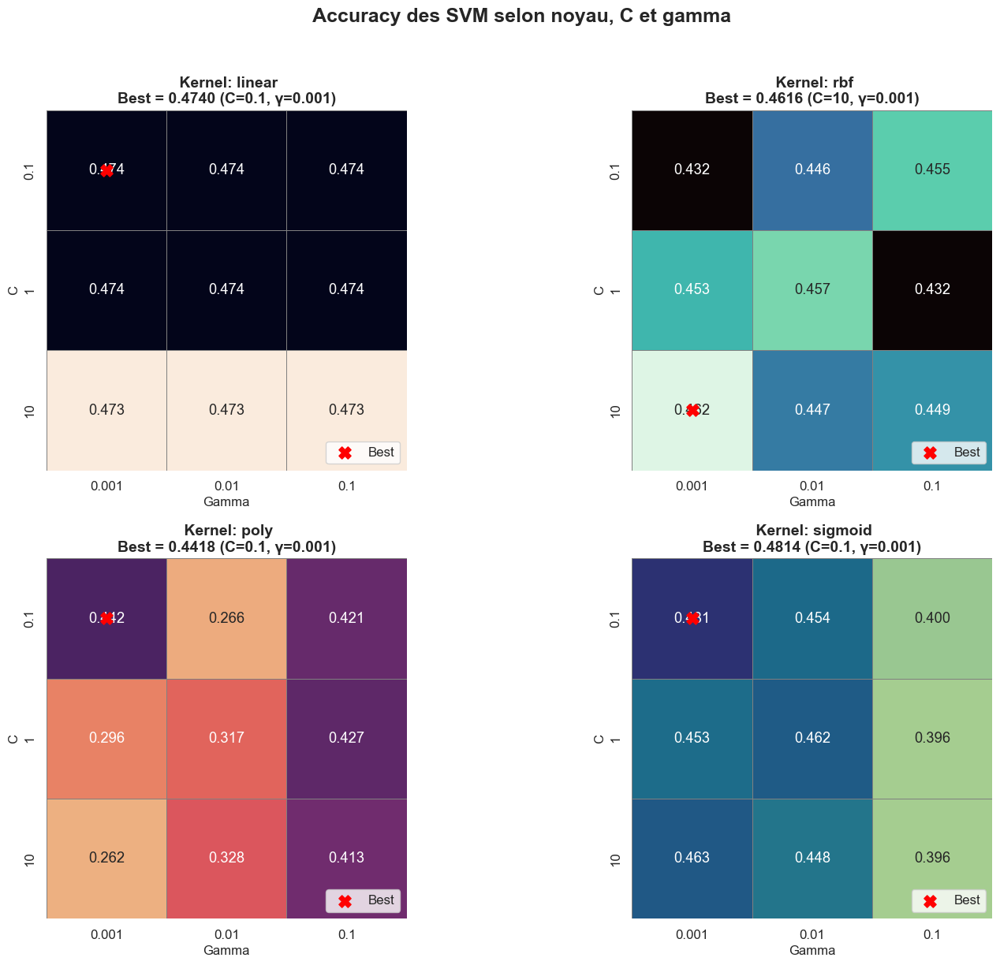

Résumé des meilleurs modèles par noyau :
 linear: 0.4740 (C=0.1, gamma=0.001)
 rbf: 0.4616 (C=10, gamma=0.001)
 poly: 0.4418 (C=0.1, gamma=0.001)
 sigmoid: 0.4814 (C=0.1, gamma=0.001)


In [76]:
C_values = [0.1, 1, 10]
gamma_values = [0.001, 0.01, 0.1]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']
results_dict = {}

for kernel in kernels:
    results = np.zeros((len(C_values), len(gamma_values)))
    for i, C in enumerate(C_values):
        for j, gamma in enumerate(gamma_values):
            try:
                model = SVC(kernel=kernel, C=C, gamma=gamma, class_weight='balanced', random_state=42)
                model.fit(X_train_scaled_m2, y_train_m2)
                y_pred = model.predict(X_test_scaled_m2)
                acc = accuracy_score(y_test_m2, y_pred)
                results[i, j] = acc
            except Exception:
                results[i, j] = np.nan
    results_dict[kernel] = results

# Affichage stylisé
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.ravel()
palettes = ['rocket_r', 'mako', 'flare', 'crest']

for idx, kernel in enumerate(kernels):
    data = results_dict[kernel]
    ax = axes[idx]
    sns.heatmap(
        data,
        annot=True,
        fmt=".3f",
        xticklabels=gamma_values,
        yticklabels=C_values,
        cmap=palettes[idx],
        cbar=False,
        square=True,
        linewidths=0.5,
        linecolor='gray',
        ax=ax
    )

    max_i, max_j = np.unravel_index(np.nanargmax(data), data.shape)
    best_acc = data[max_i, max_j]
    best_c = C_values[max_i]
    best_gamma = gamma_values[max_j]

    ax.set_title(f" Kernel: {kernel}\nBest = {best_acc:.4f} (C={best_c}, γ={best_gamma})", fontsize=14, weight='bold')
    ax.set_xlabel("Gamma", fontsize=12)
    ax.set_ylabel("C", fontsize=12)
    ax.scatter(max_j + 0.5, max_i + 0.5, s=120, color='red', marker='X', label='Best', zorder=10)
    ax.legend(loc='lower right')

plt.suptitle(" Accuracy des SVM selon noyau, C et gamma", fontsize=18, weight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Résumé textuel
print("Résumé des meilleurs modèles par noyau :")
for k, mat in results_dict.items():
    i, j = np.unravel_index(np.nanargmax(mat), mat.shape)
    print(f" {k}: {mat[i, j]:.4f} (C={C_values[i]}, gamma={gamma_values[j]})")

In [77]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=10,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Entraînement
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prédiction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Évaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.46163366336633666
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.46      0.51      0.48       239
           0       0.27      0.28      0.27       212
           1       0.60      0.54      0.57       357

    accuracy                           0.46       808
   macro avg       0.44      0.44      0.44       808
weighted avg       0.47      0.46      0.46       808

Confusion matrix SVM (m2, balanced):
[[122  68  49]
 [ 74  59  79]
 [ 72  93 192]]


Linear

In [78]:
svm_balanced_m2 = SVC(
    kernel='linear',
    C=1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Entraînement
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prédiction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Évaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.474009900990099
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.49      0.52      0.50       239
           0       0.29      0.30      0.29       212
           1       0.59      0.55      0.57       357

    accuracy                           0.47       808
   macro avg       0.45      0.46      0.45       808
weighted avg       0.48      0.47      0.48       808

Confusion matrix SVM (m2, balanced):
[[124  60  55]
 [ 67  63  82]
 [ 64  97 196]]


Polynomial

In [79]:
svm_balanced_m2 = SVC(
    kernel='poly',
    C=0.1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Entraînement
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prédiction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Évaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))
print("Confusion matrix SVM (m2, balanced):")
print(confusion_matrix(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.44183168316831684
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.00      0.00      0.00       239
           0       0.00      0.00      0.00       212
           1       0.44      1.00      0.61       357

    accuracy                           0.44       808
   macro avg       0.15      0.33      0.20       808
weighted avg       0.20      0.44      0.27       808

Confusion matrix SVM (m2, balanced):
[[  0   0 239]
 [  0   0 212]
 [  0   0 357]]


C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Sigmoïde

In [80]:
svm_balanced_m2 = SVC(
    kernel='sigmoid',
    C=0.1,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

# Entraînement
svm_balanced_m2.fit(X_train_scaled_m2, y_train_m2)

# Prédiction
y_pred_svm_m2 = svm_balanced_m2.predict(X_test_scaled_m2)

# Évaluation
print("Accuracy SVM (m2, balanced):", accuracy_score(y_test_m2, y_pred_svm_m2))
print("Classification report SVM (m2, balanced):")
print(classification_report(y_test_m2, y_pred_svm_m2))

Accuracy SVM (m2, balanced): 0.4814356435643564
Classification report SVM (m2, balanced):
              precision    recall  f1-score   support

          -1       0.41      0.60      0.49       239
           0       0.00      0.00      0.00       212
           1       0.54      0.69      0.60       357

    accuracy                           0.48       808
   macro avg       0.32      0.43      0.36       808
weighted avg       0.36      0.48      0.41       808



C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\cleme\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Dans notre cas, il est préférable d'éviter le noyau linéaire. Nous prendrons donc le rbf dans le cas d'une SVM

In [81]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=10,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)

#### 4) Regression Logistique

In [82]:
states = list(range(0, 100))
accuracies = []

for state in states:
    X_train_rs, X_test_rs, y_train_rs, y_test_rs = train_test_split(
        X_m2_encoded, y_m2, test_size=0.2, stratify=y_m2, random_state=state
    )
    model = LogisticRegression(max_iter=1000, class_weight='balanced')
    model.fit(X_train_rs, y_train_rs)
    y_pred_rs = model.predict(X_test_rs)
    acc = accuracy_score(y_test_rs, y_pred_rs)
    accuracies.append(acc)

best_state = states[accuracies.index(max(accuracies))]
best_acc = max(accuracies)

# Calcul pour zoom intelligent
acc_min = min(accuracies)
acc_max = max(accuracies)
margin = 0.02
ymin = max(0, acc_min - margin)
ymax = min(1.0, acc_max + margin)

# Préparer l’animation
fig, ax = plt.subplots(figsize=(12, 6))
line, = ax.plot([], [], marker='o', color='#0077b6', linewidth=2)
highlight, = ax.plot([], [], 'ro', markersize=10)
text = ax.text(0.72, 0.93, '', transform=ax.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.9))

ax.set_xlim(0, 99)
ax.set_ylim(ymin, ymax)
ax.set_xlabel('random_state', fontsize=12)
ax.set_ylabel('Accuracy', fontsize=12)
ax.set_title(' Accuracy selon random_state (Logistic Regression)', fontsize=16, weight='bold')
ax.grid(True, linestyle='--', alpha=0.4)

def animate(i):
    line.set_data(states[:i+1], accuracies[:i+1])
    if states[i] == best_state:
        highlight.set_data(states[i], accuracies[i])
        text.set_text(f" Best state: {best_state}\nAccuracy: {best_acc:.4f}")
    return line, highlight, text

anim = FuncAnimation(fig, animate, frames=len(states), interval=70, blit=True)
plt.close()
HTML(anim.to_jshtml())

C:\Users\cleme\AppData\Local\Temp\ipykernel_28432\1020087426.py:40: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



In [83]:
# 2. Modèle de régression logistique multinomiale
logreg_m2 = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    class_weight='balanced',
    max_iter=1000,
    random_state=13
)

# 3. Entraînement
logreg_m2.fit(X_train_scaled_m2, y_train_m2)

# 4. Prédictions
y_pred_logreg = logreg_m2.predict(X_test_scaled_m2)

# 5. Évaluation
acc_logreg = accuracy_score(y_test_m2, y_pred_logreg)
print(f"Accuracy Logistic Regression (m2): {acc_logreg:.4f}\n")

print("Classification report Logistic Regression (m2) :")
print(classification_report(y_test_m2, y_pred_logreg))
print(classification_report(y_test_m2, y_pred_logreg))


Accuracy Logistic Regression (m2): 0.4752

Classification report Logistic Regression (m2) :
              precision    recall  f1-score   support

          -1       0.47      0.54      0.51       239
           0       0.28      0.23      0.25       212
           1       0.58      0.57      0.58       357

    accuracy                           0.48       808
   macro avg       0.44      0.45      0.44       808
weighted avg       0.47      0.48      0.47       808

              precision    recall  f1-score   support

          -1       0.47      0.54      0.51       239
           0       0.28      0.23      0.25       212
           1       0.58      0.57      0.58       357

    accuracy                           0.48       808
   macro avg       0.44      0.45      0.44       808
weighted avg       0.47      0.48      0.47       808



#### 5) Random Forrest

In [84]:
# Entraînement
rf_m2 = RandomForestClassifier(n_estimators=100, random_state=50, class_weight='balanced')
rf_m2.fit(X_train_m2, y_train_m2)

# Prédiction
y_pred_rf_m2 = rf_m2.predict(X_test_m2)

# Évaluation
print(f"Accuracy RF (m2): {accuracy_score(y_test_m2, y_pred_rf_m2):.4f}")
print("\nClassification report RF (m2) :")
print(classification_report(y_test_m2, y_pred_rf_m2))

Accuracy RF (m2): 0.4208

Classification report RF (m2) :
              precision    recall  f1-score   support

          -1       0.41      0.45      0.43       239
           0       0.28      0.30      0.29       212
           1       0.53      0.47      0.50       357

    accuracy                           0.42       808
   macro avg       0.41      0.41      0.41       808
weighted avg       0.43      0.42      0.42       808



Pour avoir testé, les random_states donnes tous quasiment les mêmes résultats.

#### 6) XGBOOST


In [85]:
# 1. Recode y en [0, 1, 2]
y_train_xgb = y_train_m2.replace({-1: 0, 0: 1, 1: 2})
y_test_xgb = y_test_m2.replace({-1: 0, 0: 1, 1: 2})

# 2. Modèle XGBoost
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=45
)
model.fit(X_train_m2, y_train_xgb)
y_pred_encoded = model.predict(X_test_m2)

# 3. Reconvertir les prédictions en [-1, 0, 1]
reverse_map = {0: -1, 1: 0, 2: 1}
y_pred_xgb = pd.Series(y_pred_encoded).map(reverse_map)

# 4. Évaluation
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

print("Accuracy XGBoost:", accuracy_score(y_test_m2, y_pred_xgb))
print(classification_report(y_test_m2, y_pred_xgb))

C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:33] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




Accuracy XGBoost: 0.44801980198019803
              precision    recall  f1-score   support

          -1       0.43      0.39      0.41       239
           0       0.28      0.21      0.24       212
           1       0.52      0.63      0.57       357

    accuracy                           0.45       808
   macro avg       0.41      0.41      0.41       808
weighted avg       0.43      0.45      0.44       808



# Selection des modèles et test de robustesse

#### 1) Validation Croisée

KNN

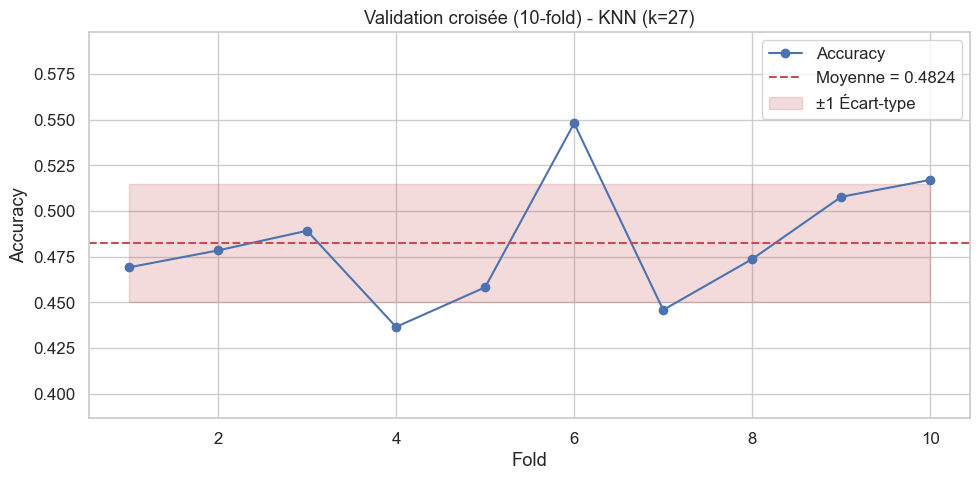

✅ Accuracy moyenne (CV 10-fold) : 0.4824
📉 Écart-type : 0.0324


In [86]:
# Modèle KNN
knn_m2 = KNeighborsClassifier(n_neighbors=27)

# Définition de la validation croisée
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Application de la validation croisée sur les données standardisées
cv_scores = cross_val_score(knn_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')

# Moyenne et écart-type des scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Affichage graphique
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Écart-type')
plt.title("Validation croisée (10-fold) - KNN (k=27)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Résumé dans la console
print(f"✅ Accuracy moyenne (CV 10-fold) : {cv_mean:.4f}")
print(f"📉 Écart-type : {cv_std:.4f}")

SVM

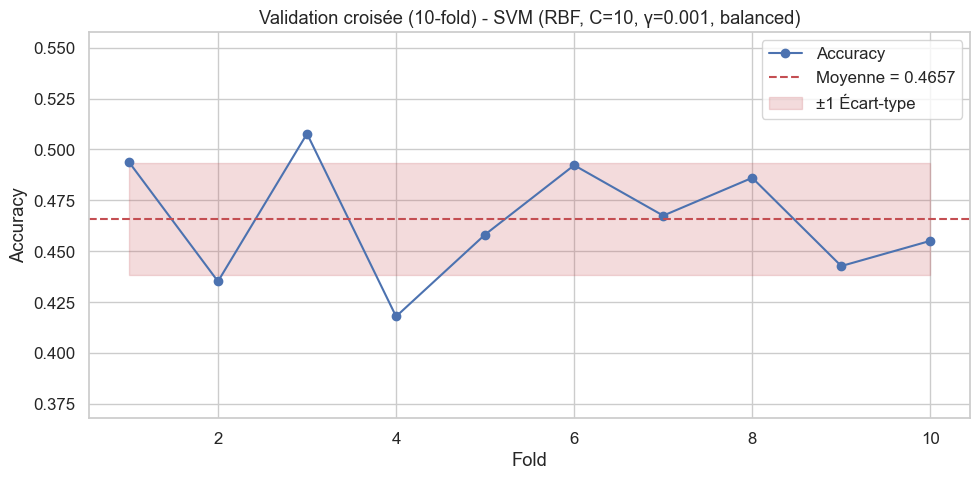

Accuracy moyenne (CV 10-fold) : 0.4657
 Écart-type : 0.0275


In [87]:
svm_balanced_m2 = SVC(
    kernel='rbf',
    C=10,
    gamma=0.001,
    class_weight='balanced',
    random_state=42
)
# Définition de la validation croisée
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Application de la validation croisée sur les données standardisées
cv_scores = cross_val_score(svm_balanced_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')

# Moyenne et écart-type des scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Affichage graphique
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Écart-type')
plt.title("Validation croisée (10-fold) - SVM (RBF, C=10, γ=0.001, balanced)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Résumé dans la console
print(f"Accuracy moyenne (CV 10-fold) : {cv_mean:.4f}")
print(f" Écart-type : {cv_std:.4f}")


Regression Logistique

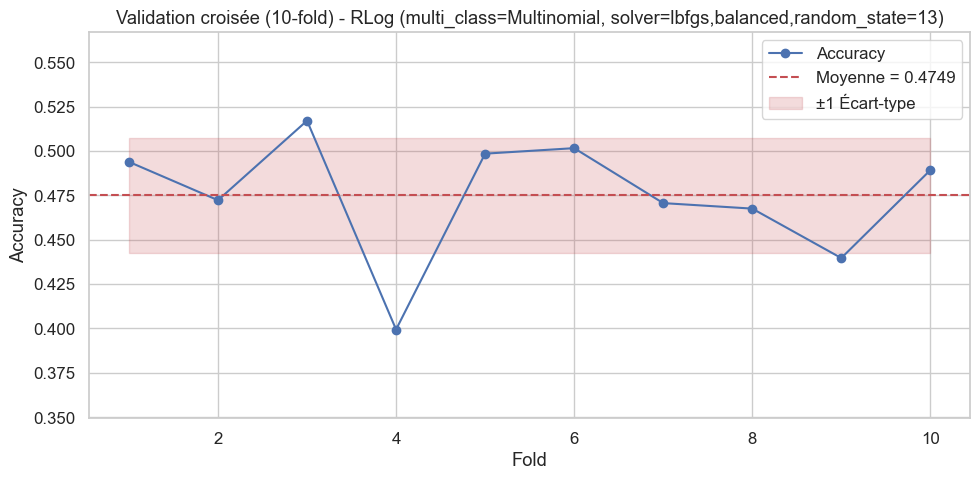

Accuracy moyenne (CV 10-fold) : 0.4749
 Écart-type : 0.0326


In [88]:
logreg_m2 = LogisticRegression(
    multi_class='multinomial',
    solver='lbfgs',
    class_weight='balanced',
    max_iter=1000,
    random_state=13
)


# Définition de la validation croisée
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Application de la validation croisée sur les données standardisées
cv_scores = cross_val_score(logreg_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')

# Moyenne et écart-type des scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Affichage graphique
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Écart-type')
plt.title("Validation croisée (10-fold) - RLog (multi_class=Multinomial, solver=lbfgs,balanced,random_state=13)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Résumé dans la console
print(f"Accuracy moyenne (CV 10-fold) : {cv_mean:.4f}")
print(f" Écart-type : {cv_std:.4f}")

Random Forest

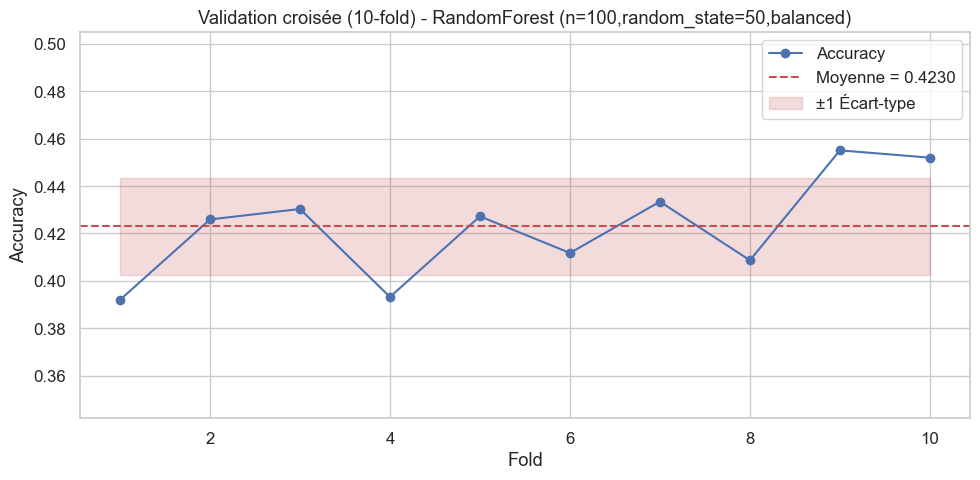

Accuracy moyenne (CV 10-fold) : 0.4230
 Écart-type : 0.0206


In [89]:
rf_m2 = RandomForestClassifier(n_estimators=100, random_state=50, class_weight='balanced')
# Définition de la validation croisée
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Application de la validation croisée sur les données standardisées
cv_scores = cross_val_score(rf_m2, X_train_scaled_m2, y_train_m2, cv=cv, scoring='accuracy')

# Moyenne et écart-type des scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Affichage graphique
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Écart-type')
plt.title("Validation croisée (10-fold) - RandomForest (n=100,random_state=50,balanced)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Résumé dans la console
print(f"Accuracy moyenne (CV 10-fold) : {cv_mean:.4f}")
print(f" Écart-type : {cv_std:.4f}")

XGBoost

C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:55] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:56] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.


C:\Users\cleme\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[11:00:57] WARNING: C:\actions-runner\_work\xgboost\xgboos

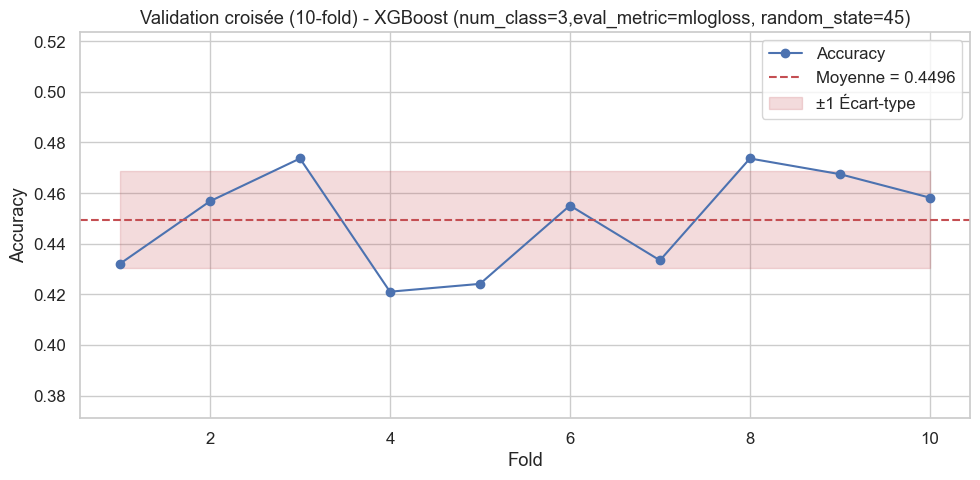

Accuracy moyenne (CV 10-fold) : 0.4496
 Écart-type : 0.0191


In [90]:
model = xgb.XGBClassifier(
    objective='multi:softmax',
    num_class=3,
    eval_metric='mlogloss',
    use_label_encoder=False,
    random_state=45
)
# Définition de la validation croisée
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Application de la validation croisée sur les données standardisées
# Recode les classes pour XGBoost : -1 → 0, 0 → 1, 1 → 2
y_train_xgb_cv = y_train_m2.replace({-1: 0, 0: 1, 1: 2})

cv_scores = cross_val_score(model, X_train_scaled_m2, y_train_xgb_cv, cv=cv, scoring='accuracy')

# Moyenne et écart-type des scores
cv_mean = np.mean(cv_scores)
cv_std = np.std(cv_scores)

# Affichage graphique
plt.figure(figsize=(10, 5))
plt.plot(range(1, 11), cv_scores, marker='o', linestyle='-', label='Accuracy')
plt.axhline(y=cv_mean, color='r', linestyle='--', label=f'Moyenne = {cv_mean:.4f}')
plt.fill_between(range(1, 11), cv_mean - cv_std, cv_mean + cv_std, color='r', alpha=0.2, label='±1 Écart-type')
plt.title("Validation croisée (10-fold) - XGBoost (num_class=3,eval_metric=mlogloss, random_state=45)")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.ylim(min(cv_scores) - 0.05, max(cv_scores) + 0.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Résumé dans la console
print(f"Accuracy moyenne (CV 10-fold) : {cv_mean:.4f}")
print(f" Écart-type : {cv_std:.4f}")

#### 2) Bonus: Test de Robustesse au bruit (pour éviter l'overfitting)

In [91]:
# Copie de X_train bruitée
np.random.seed(42)  # pour reproductibilité
noise_factor = 2  # intensité du bruit

# Ajout de bruit gaussien aux features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)

# Réentraînement du modèle sur données bruitées
knn_m2.fit(X_train_noisy, y_train_m2)

# Évaluation sur données de test propres (non bruitées)
y_pred_noisy = knn_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy sur test KNN (modèle entraîné avec bruit) : {acc_noisy:.4f}")

 Accuracy sur test KNN (modèle entraîné avec bruit) : 0.4530


In [92]:
# Copie de X_train bruitée
np.random.seed(42)  # pour reproductibilité
noise_factor = 2  # intensité du bruit

# Ajout de bruit gaussien aux features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)

# Réentraînement du modèle sur données bruitées
svm_balanced_m2.fit(X_train_noisy, y_train_m2)

# Évaluation sur données de test propres (non bruitées)
y_pred_noisy = svm_balanced_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy sur test SVM (modèle entraîné avec bruit) : {acc_noisy:.4f}")

 Accuracy sur test SVM (modèle entraîné avec bruit) : 0.4691


In [93]:
# Copie de X_train bruitée
np.random.seed(42)  # pour reproductibilité
noise_factor = 2  # intensité du bruit

# Ajout de bruit gaussien aux features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)

# Réentraînement du modèle sur données bruitées
logreg_m2.fit(X_train_noisy, y_train_m2)

# Évaluation sur données de test propres (non bruitées)
y_pred_noisy = logreg_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy sur test Regression Logistique (modèle entraîné avec bruit) : {acc_noisy:.4f}")

 Accuracy sur test Regression Logistique (modèle entraîné avec bruit) : 0.4579


In [94]:
# Copie de X_train bruitée
np.random.seed(42)  # pour reproductibilité
noise_factor = 2  # intensité du bruit

# Ajout de bruit gaussien aux features
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X_train_scaled_m2.shape)

# Réentraînement du modèle sur données bruitées
rf_m2.fit(X_train_noisy, y_train_m2)

# Évaluation sur données de test propres (non bruitées)
y_pred_noisy = rf_m2.predict(X_test_scaled_m2)
acc_noisy = accuracy_score(y_test_m2, y_pred_noisy)

print(f" Accuracy sur test Random Forest (modèle entraîné avec bruit) : {acc_noisy:.4f}")

 Accuracy sur test Random Forest (modèle entraîné avec bruit) : 0.4740


In [95]:

# Pour reproductibilité
np.random.seed(42)

# Intensité du bruit
noise_factor = 2  

# Transformation des labels en 0, 1, 2 (XGBoost ne supporte pas les labels négatifs)
y_train_012 = y_train_m2.replace({-1: 0, 0: 1, 1: 2})
y_test_012 = y_test_m2.replace({-1: 0, 0: 1, 1: 2})

# Ajout de bruit gaussien aux features d'entraînement
X_train_noisy = X_train_scaled_m2 + noise_factor * np.random.normal(
    loc=0.0, scale=1.0, size=X_train_scaled_m2.shape
)

# Création et entraînement du modèle XGBoost (ne pas réutiliser un ancien modèle déjà fit)
model = XGBClassifier()
model.fit(X_train_noisy, y_train_012)

# Prédictions sur le jeu de test non bruité
y_pred_noisy = model.predict(X_test_scaled_m2)

# Évaluation de l'accuracy
acc_noisy = accuracy_score(y_test_012, y_pred_noisy)
print(f"✅ Accuracy sur test XGBoost (modèle entraîné avec bruit) : {acc_noisy:.4f}")

✅ Accuracy sur test XGBoost (modèle entraîné avec bruit) : 0.4678


# Prédiction

In [96]:
X_pred_m2 = data_matchs2_m2[X_train_m2.columns]

# 2. Standardisation avec le scaler utilisé à l'entraînement
X_pred_scaled_m2 = scaler_m2.transform(X_pred_m2)

# 3. Prédiction
y_pred_final_m2 = svm_balanced_m2.predict(X_pred_scaled_m2)


In [97]:
prediction_example = pd.read_csv("prediction_example.csv")
prediction_example["logpred"] = y_pred_final_m2

prediction_example.to_csv("MaPredictionFinale.csv", index=False) # index=False pour éviter d’ajouter l’index interne à pandas
# Voilà !

In [98]:
def estConforme(monFichier_csv):
    votre_prediction = pd.read_csv(monFichier_csv)

    fichier_exemple = pd.read_csv("prediction_example.csv")

    assert votre_prediction.columns[1] == fichier_exemple.columns[1], f"Attention, votre colonne de prédiction doit s'appeler {fichier_exemple.columns[1]}, elle s'appelle '{votre_prediction.columns[1]}'"
    assert len(votre_prediction) == len(fichier_exemple), f"Attention, vous devriez avoir {len(fichier_exemple)} prédiction dans votre fichier, il en contient '{len(votre_prediction)}'"

    assert np.all(votre_prediction.iloc[:,0] == fichier_exemple.iloc[:, 0])

    print("Fichier conforme!")

estConforme("MaPredictionFinale.csv")

Fichier conforme!
